In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
import itertools
import numpy as np
import pandas as pd 
from numpy import std
from numpy import mean
import matplotlib.pyplot as plt
from sklearn.datasets import make_regression
from sklearn.ensemble import BaggingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split

%matplotlib inline

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
df_roof = pd.read_csv('/content/drive/MyDrive/project-ds2/df_roof.csv')
df_condn = pd.read_csv('/content/drive/MyDrive/project-ds2/df_condn.csv')
df_wall = pd.read_csv('/content/drive/MyDrive/project-ds2/df_wall.csv')
df_floor = pd.read_csv('/content/drive/MyDrive/project-ds2/df_floor.csv')
df_room = pd.read_csv('/content/drive/MyDrive/project-ds2/df_room.csv')
df_hhold = pd.read_csv('/content/drive/MyDrive/project-ds2/df_hhold.csv')
df_couple = pd.read_csv('/content/drive/MyDrive/project-ds2/df_couple.csv')
df_owner = pd.read_csv('/content/drive/MyDrive/project-ds2/df_owner.csv')
df_water = pd.read_csv('/content/drive/MyDrive/project-ds2/df_water.csv')
df_light = pd.read_csv('/content/drive/MyDrive/project-ds2/df_light.csv')
df_toilet = pd.read_csv('/content/drive/MyDrive/project-ds2/df_toilet.csv')
df_bath = pd.read_csv('/content/drive/MyDrive/project-ds2/df_bath.csv')
df_fuel = pd.read_csv('/content/drive/MyDrive/project-ds2/df_fuel.csv')
df_kitchen = pd.read_csv('/content/drive/MyDrive/project-ds2/df_kitchen.csv')
df_assets = pd.read_csv('/content/drive/MyDrive/project-ds2/df_assets.csv')
df_house = pd.read_csv('/content/drive/MyDrive/project-ds2/df_house.csv')
df_waste = pd.read_csv('/content/drive/MyDrive/project-ds2/df_waste.csv')

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2882: DtypeWarning: Columns (0) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [4]:
def my_pct(pct):
  return ('%1.0f' %  pct) + '%' if pct > 3 else ''

In [5]:
palette_color2 = sns.hls_palette(14, l=0.5, s=1)

In [6]:
dataframes = [df_roof,df_condn,df_wall,df_floor,df_room,df_hhold,df_couple,df_owner,df_water,df_light,
              df_toilet,df_bath,df_fuel,df_kitchen,df_assets,df_house, df_waste]
list_want = ['roof', 'condn', 'wall', 'floor', 'room', 'hhold', 'couple', 'owner',
             'water', 'light', 'toilet', 'bath', 'fuel', 'kitchen', 'assets', 'house', 'waste']

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:25: MatplotlibDeprecationWarning: Automatic legend placement (loc='best') not implemented for figure legend. Falling back on 'upper right'. This will raise an exception in 3.3.


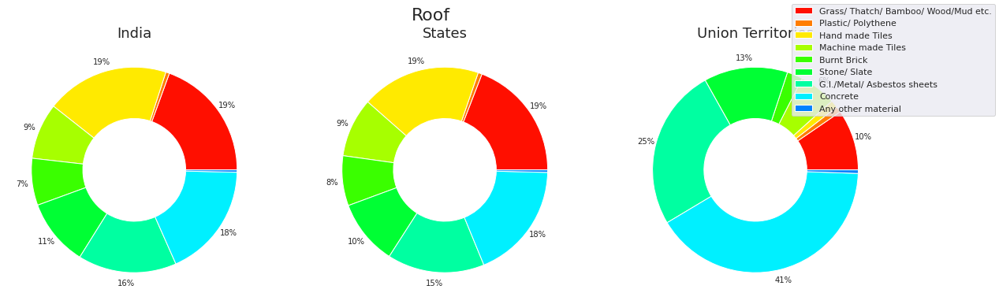

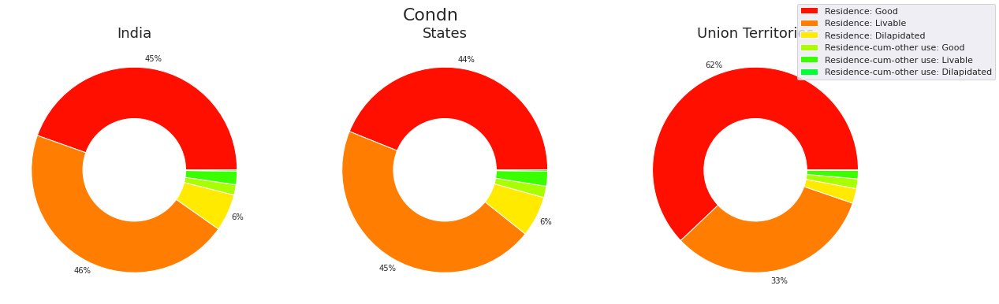

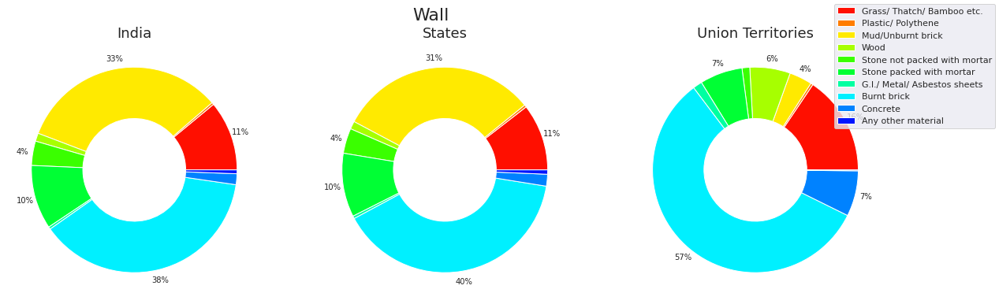

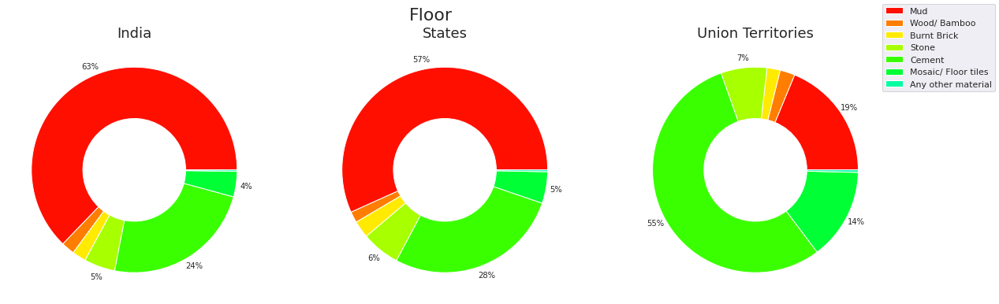

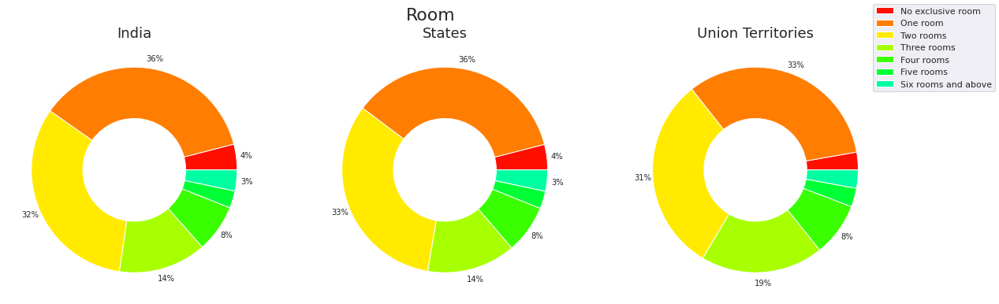

...

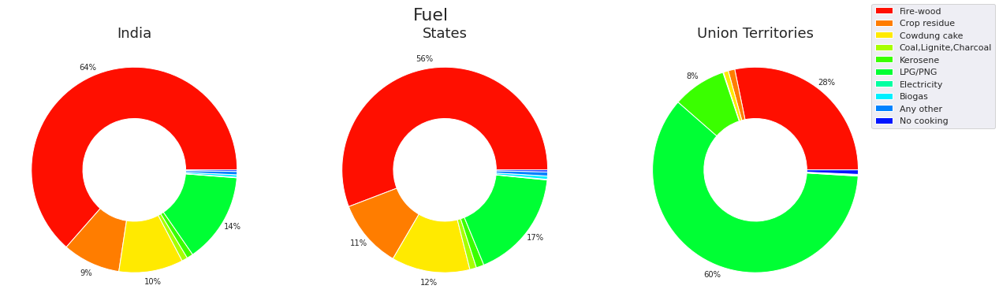

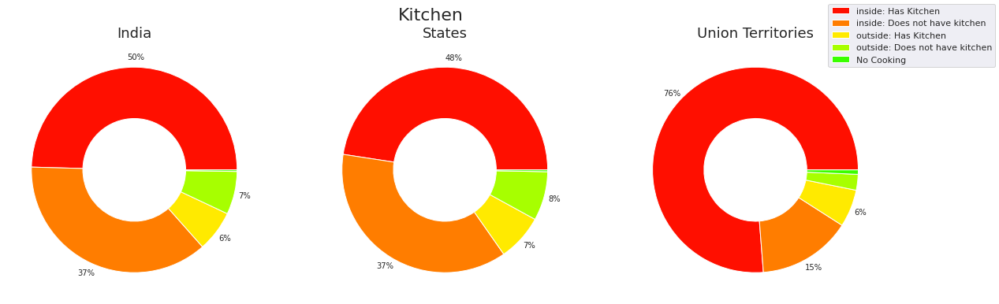

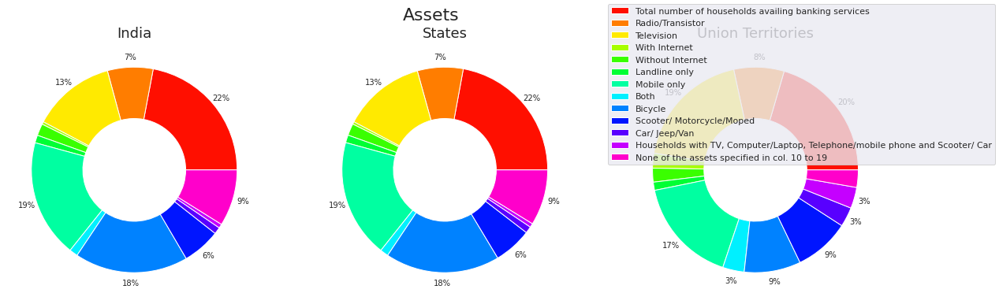

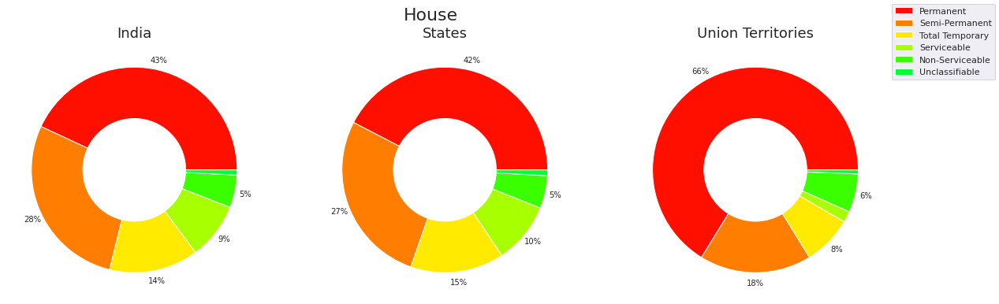

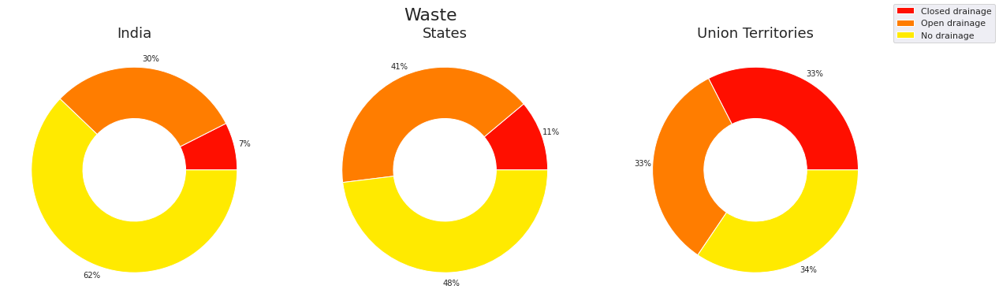

In [7]:
# comparing the union territories and states to India
cnt = 0
for i in dataframes:
  df_want = i[(i['State Name']=='ANDAMAN & NICOBAR ISLANDS') | (i['State Name']=='CHANDIGARH') | 
              (i['State Name']=='LAKSHADWEEP') | (i['State Name']=='DAMAN & DIU') |
              (i['State Name']=='NCT OF DELHI') | (i['State Name']=='DADRA & NAGAR HAVELI') |
              (i['State Name']=='PUDUCHERRY')]

  k =df_want.iloc[:, 4:].mean(axis=0)
  l =i.iloc[:, 4:].mean(axis=0)

  df_states = pd.concat([i, df_want, df_want]).drop_duplicates(keep=False)
  k2 =df_states.iloc[:, 4:].mean(axis=0) 

  fig, axs = plt.subplots(1,3,figsize=(20,6))
  fig.suptitle(list_want[cnt].capitalize(), fontsize=22)
  axs[0].pie(x=l, labels=None, colors=palette_color2, autopct=my_pct,pctdistance=1.1,wedgeprops=dict(width=.5))
  axs[0].set_title('India', fontsize=18)
  axs[1].pie(x=k2, labels=None, colors=palette_color2, autopct=my_pct,pctdistance=1.1,wedgeprops=dict(width=.5))
  axs[1].set_title('States', fontsize=18)
  axs[2].pie(x=k, labels=None, colors=palette_color2, autopct=my_pct,pctdistance=1.1,wedgeprops=dict(width=.5))
  axs[2].set_title('Union Territories', fontsize=18)

  keys = df_want.columns[4:]
  fig.legend(labels = keys,loc='best')
  # plt.savefig('/content/drive/MyDrive/project-ds2/EDA Plots/' + list_want[cnt] + '.jpg', dpi=300)
  cnt+=1
  plt.show()

**Here we are doing it for just a single state as an example, because doing it for all the states just makes too many plots, and then it gets all messed up.</br> We also thought of taking 'x' as the input from the viewer, but then there would have been troubles while running the notebook.**

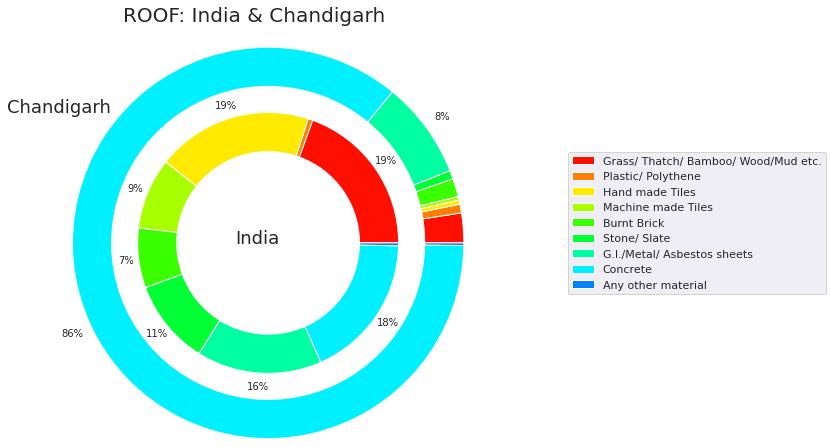

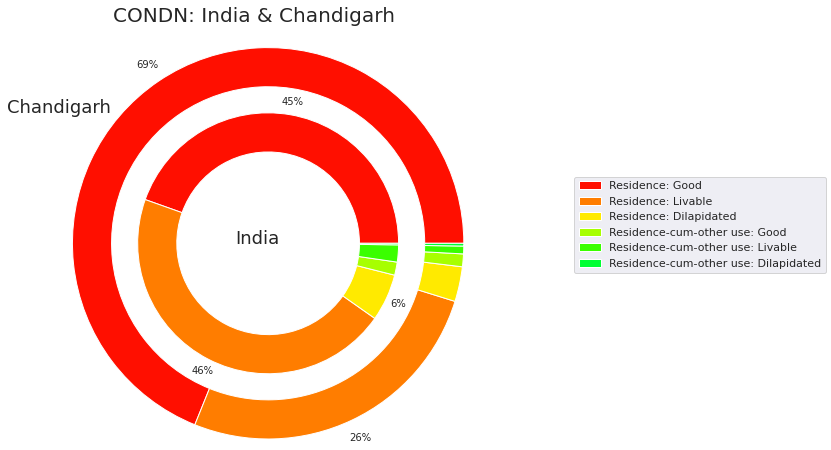

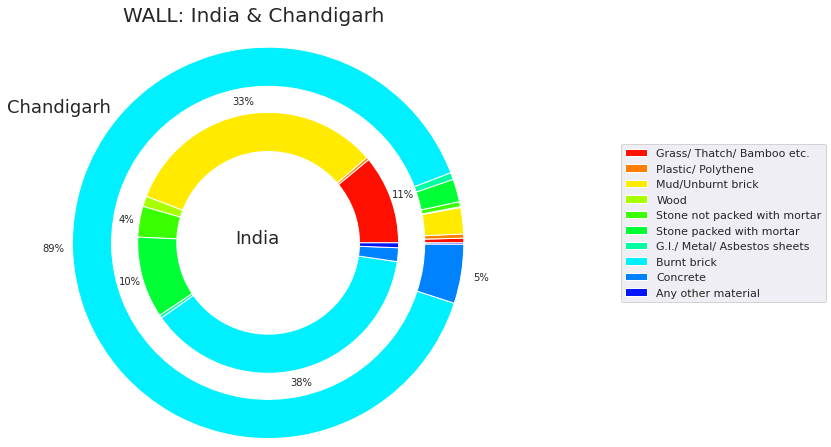

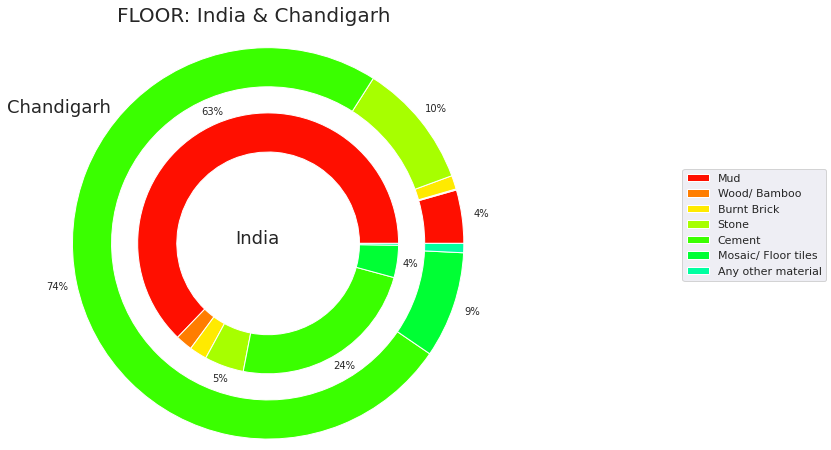

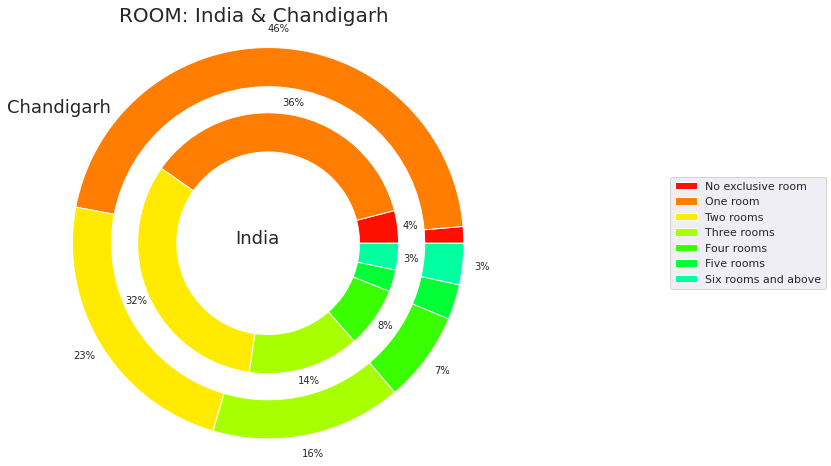

...

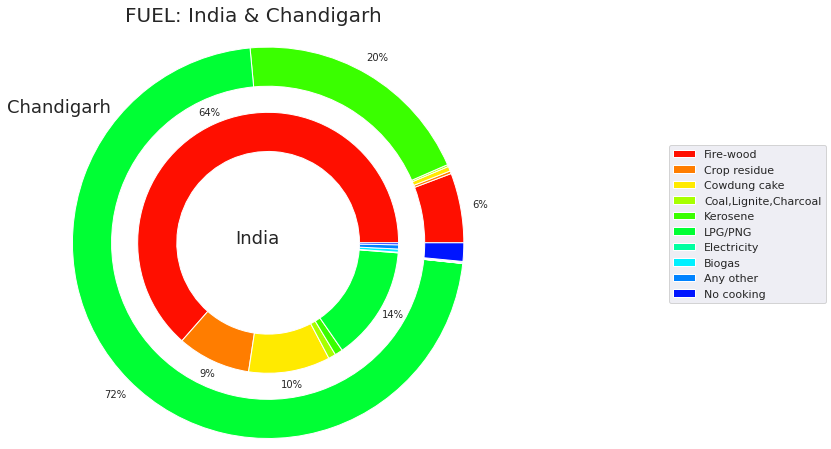

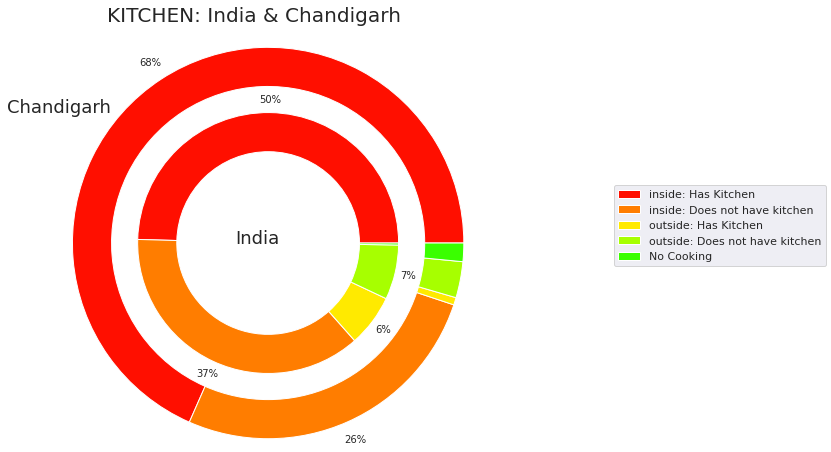

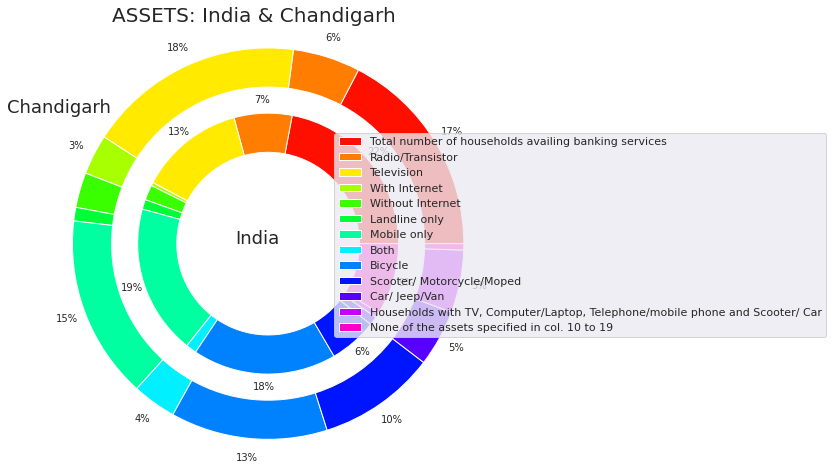

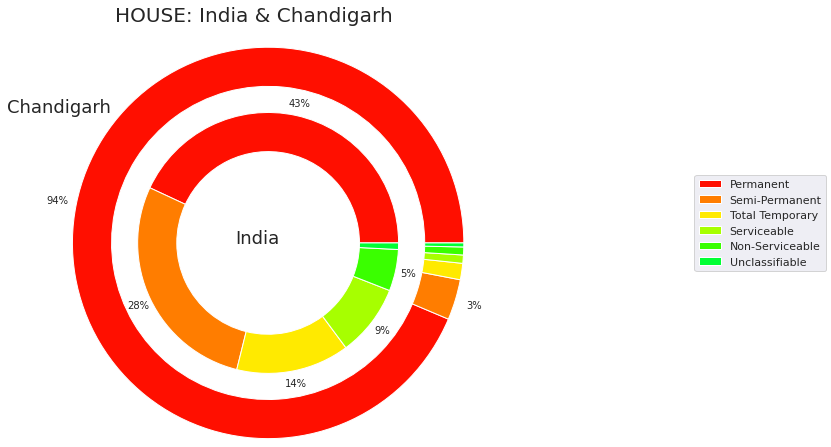

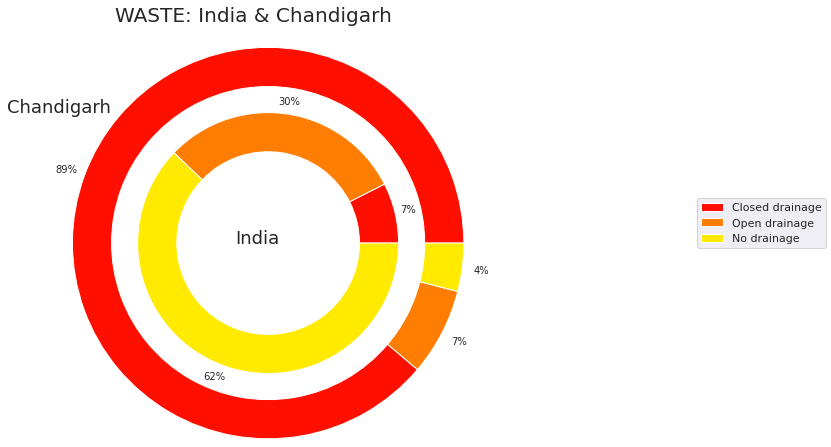

In [8]:
# selecting a state
x = 'CHANDIGARH'
palette_color2 = sns.hls_palette(14, l=0.5, s=1)

# comparing it to India
cnt = 0
for i in dataframes:
  df_want = i[i['State Name']==x]
  k =df_want.iloc[:, 4:].mean(axis=0)
  l =i.iloc[:, 4:].mean(axis=0)

  fig, axs = plt.subplots(1,1,figsize=(16,6))
  fig.suptitle(list_want[cnt].upper() + ': India & ' + x.capitalize(), fontsize=20,y=1.05)
  axs.pie(x=l, labels=None, radius = 1, colors=palette_color2,autopct=my_pct,
            pctdistance=1.1,wedgeprops=dict(width=.3)) 
  axs.text(-0.25,0, 'India', {'fontsize': 18})

  axs.pie(x=k, labels=None, radius = 1.5, colors=palette_color2,autopct=my_pct,
            pctdistance=1.1, wedgeprops=dict(width=.3))
  keys = df_want.columns[4:]
  axs.text(-2,1, x.capitalize(), {'fontsize': 18})
  fig.legend(labels = keys, loc='center right')
  # plt.savefig('/content/drive/MyDrive/project-ds2/EDA Plots/'+ x + list_want[cnt] + '.jpg', dpi=300)
  cnt+=1
  plt.show()


**Here we plotted all the states for each feature.
But as the plot was very large, it was difficult to interpret. So, now we shall just plot the important features and values shown in the inferences.</br> All the others can be found in the drive.**

In [9]:
# cnt1 = 0
# for x in dataframes:
#   # function for state-level visualizations
#   k = x.drop(['District Code'], axis=1)
#   l =k.groupby('State Name').agg('mean')


#   fig, axs = plt.subplots(7,5,figsize=(42,40),  constrained_layout = True)
#   fig.suptitle(list_want[cnt1].upper(), fontsize=22)
#   cnt = 0
#   sorted_states = sorted(k['State Name'].unique())
#   for i in sorted_states:
#     keys = l.columns
#     values = l.loc[i]
#     axs[cnt//5][cnt%5].pie(x=values, labels=None, colors=palette_color2, autopct=my_pct,
#             pctdistance=1.1,wedgeprops=dict(width=.5),explode=(values == max(values)) * 0.1)
#     axs[cnt//5][cnt%5].set_title(i, fontsize=18)
#     axs[cnt//5][cnt%5].set_label(None)
#     cnt+=1

#   fig.legend(labels = keys, loc='upper right')
#   # plt.savefig('/content/drive/MyDrive/project-ds2/EDA Plots/'+ 'df_' + list_want[cnt1] + '.jpg', dpi=300)
  
#   cnt1+=1
#   plt.show()

**The main reason for using pie charts for seeing the percentage is because it makes it so easy to see the fractions.</br> In this vsualization we have tried to see the distribution of each facility across the states.**

**Lighting**

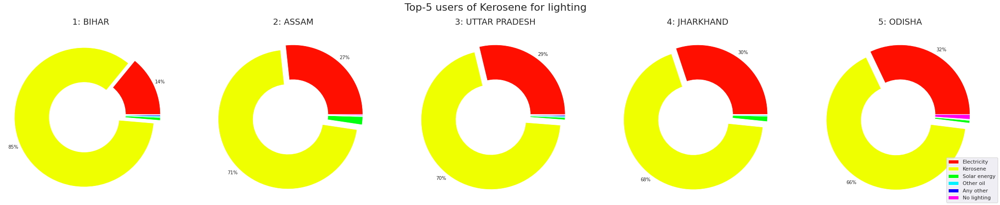

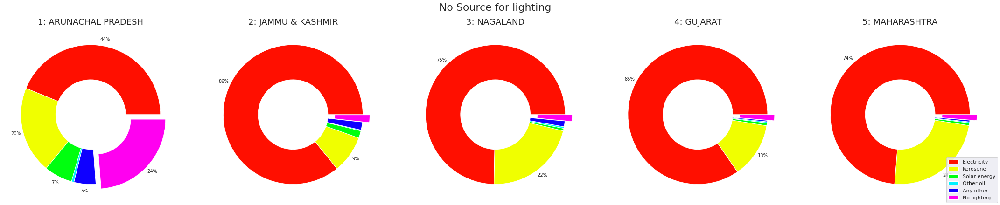

In [10]:
k = df_light.drop(['District Code'], axis=1)
l =k.groupby('State Name').agg('mean')

palette_color3 = sns.hls_palette(6, l=0.5, s=1)

# kerosene
fig, axs = plt.subplots(1,5,figsize=(30,6),  constrained_layout = True)
fig.suptitle('Top-5 users of Kerosene for lighting', fontsize=22)
x = l.sort_values(by='Kerosene', ascending=False)
cnt = 0
for i in x.index[:5]:
  keys = x.columns
  values = x.loc[i]
  axs[cnt].pie(x=values, labels=None, colors=palette_color3, autopct=my_pct,
            pctdistance=1.1,wedgeprops=dict(width=.5),explode=(values == values[1]) * 0.1)
  axs[cnt].set_title('{}: {}'.format(cnt+1,i), fontsize=18)
  axs[cnt].set_label(None)
  cnt+=1

fig.legend(labels = keys, loc='lower right')  
plt.show()

# solar energy

fig, axs = plt.subplots(1,5,figsize=(30,6),  constrained_layout = True)
fig.suptitle('No Source for lighting', fontsize=22)
x = l.sort_values(by='No lighting', ascending=False)
cnt = 0
for i in x.index[:5]:
  keys = x.columns
  values = x.loc[i]
  axs[cnt].pie(x=values, labels=None, colors=palette_color3, autopct=my_pct,
            pctdistance=1.1,wedgeprops=dict(width=.5),explode=(values == values[-1]) * 0.1)
  axs[cnt].set_title('{}: {}'.format(cnt+1,i), fontsize=18)
  axs[cnt].set_label(None)
  cnt+=1

fig.legend(labels = keys, loc='lower right')  
plt.show()

**df_light: Most of the sates have electricity for lighting source. Bihar, Assam, Uttar Pradesh, Odisha, and Jharkhand use mostly kerosene for lighting.Arunachal Pradesh is the only state where a significant fraction of the homes have no lighting.**

**Roof**

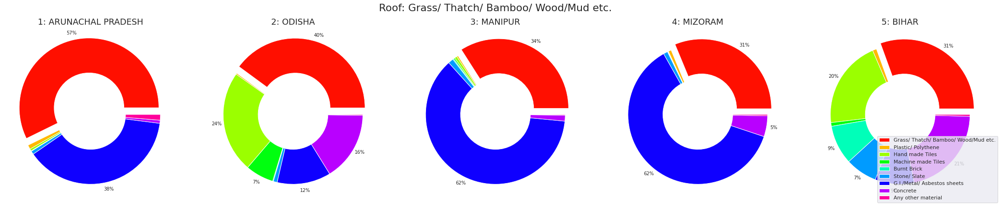

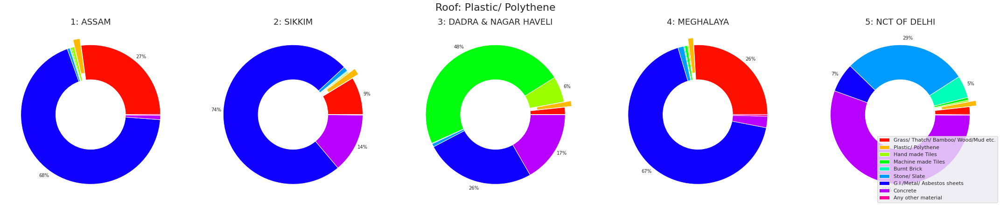

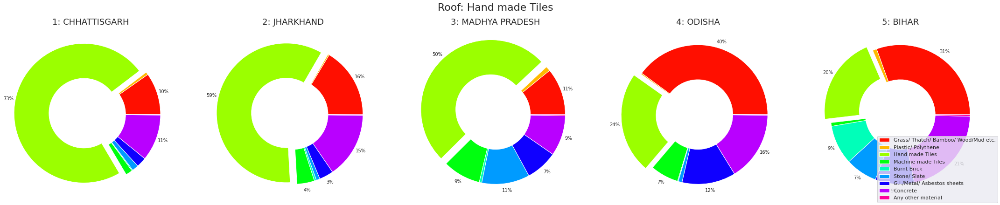

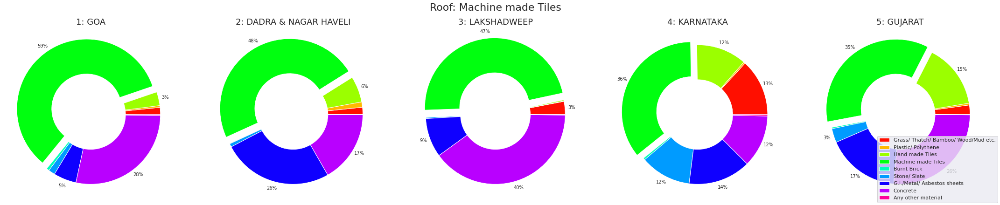

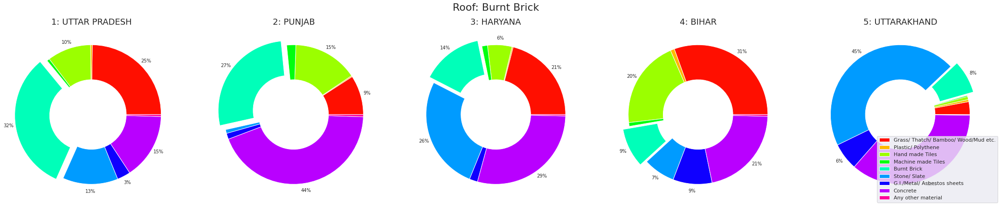

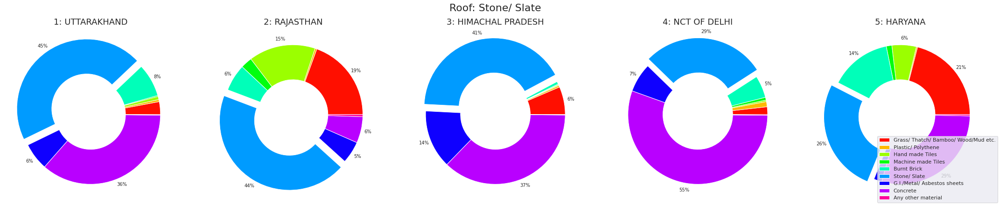

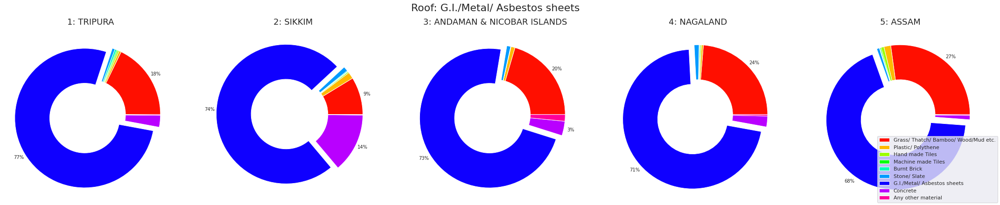

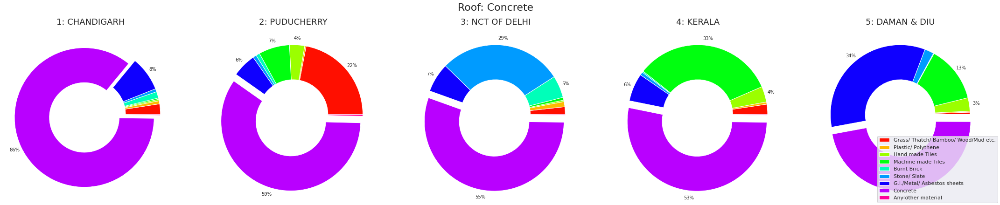

In [14]:
k = df_roof.drop(['District Code'], axis=1)
l =k.groupby('State Name').agg('mean')

palette_color3 = sns.hls_palette(9, l=0.5, s=1)

y = 0
for z in l.columns[:-1]:
  fig, axs = plt.subplots(1,5,figsize=(30,6),  constrained_layout = True)
  fig.suptitle('Roof: {}'.format(z), fontsize=22)
  x = l.sort_values(by=z, ascending=False)
  cnt = 0
  for i in x.index[:5]:
    keys = x.columns
    values = x.loc[i]
    axs[cnt].pie(x=values, labels=None, colors=palette_color3, autopct=my_pct,
              pctdistance=1.1,wedgeprops=dict(width=.5),explode=(values == values[y]) * 0.1)
    axs[cnt].set_title('{}: {}'.format(cnt+1,i), fontsize=18)
    axs[cnt].set_label(None)
    cnt+=1
    

  y+=1
  fig.legend(labels = keys, loc='lower right')  
  plt.show()

**df_roof: The central states (Chhatisgarh, Madhya Pradesh and Jharkhand) have significant percentage of roofs made of handmade tiles. Machine made bricks are very common in Goa, Dadra & Nagar Haveli, Lashadweep, Karnataka and Gujarat. Stone/slate roofs are common in Uttarakhand, Rajasthan, Himachal Pradesh. Highest ratio of burnt brick is used in Uttar Pradesh. The north-eastern states have high percentage of roofs made of G.I./ metal/asbestos sheets, with exceptions of J&K and Andaman & Nicobar islands. Chandigarh has highest percentage of concrete roofs. The western states have roofs made of machine-made tiles.**

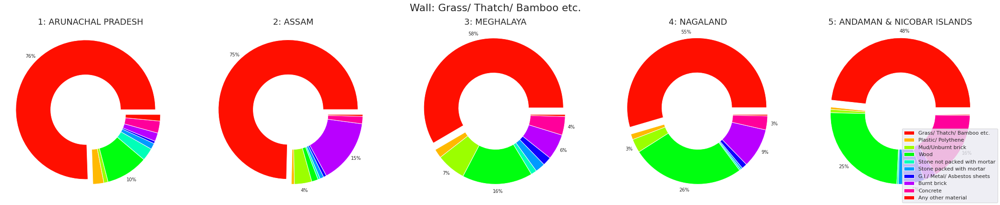

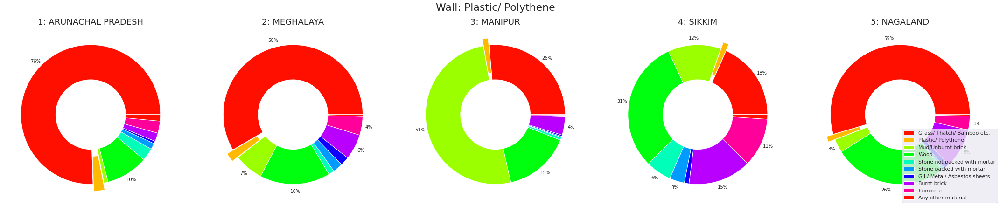

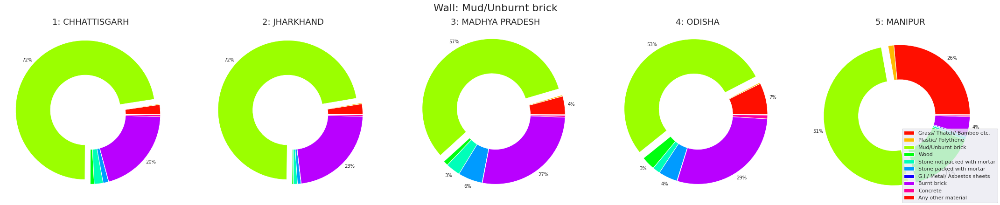

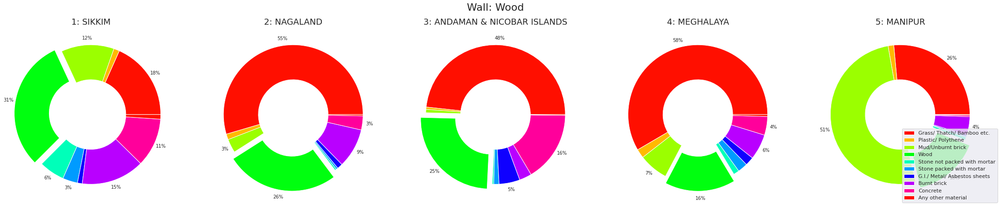

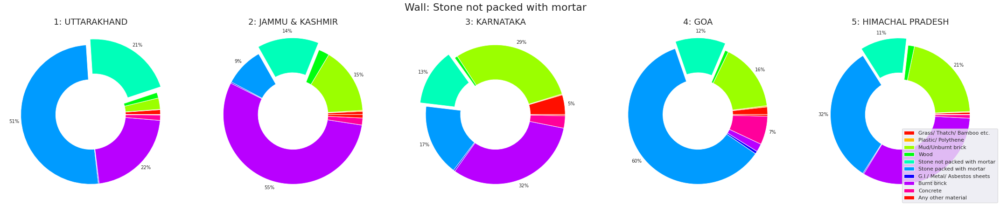

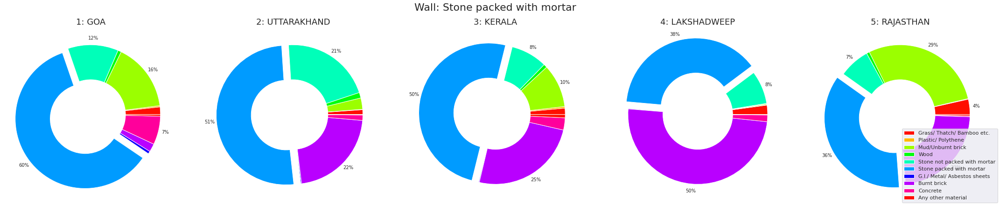

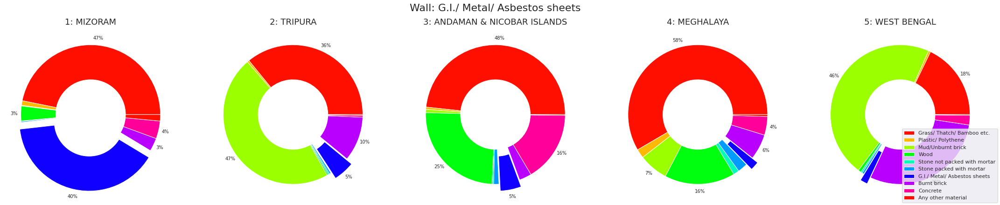

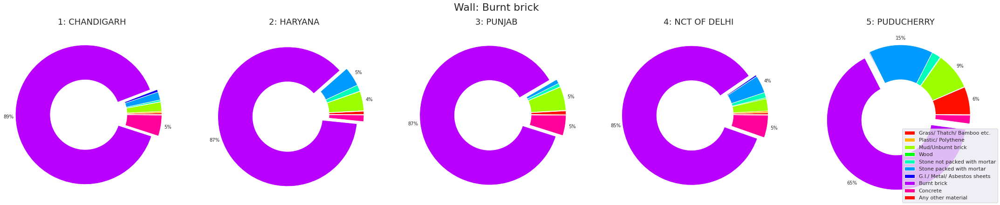

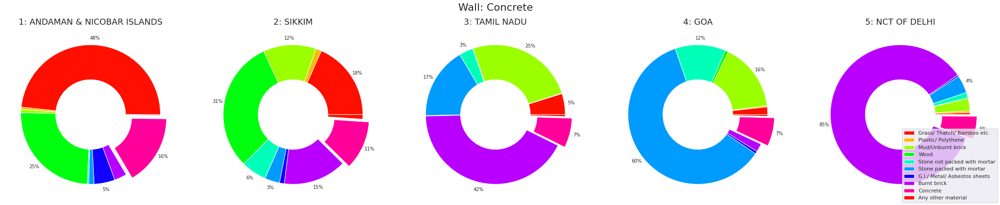

In [17]:
k = df_wall.drop(['District Code'], axis=1)
l =k.groupby('State Name').agg('mean')

palette_color3 = sns.hls_palette(9, l=0.5, s=1)

y = 0
for z in l.columns[:-1]:
  fig, axs = plt.subplots(1,5,figsize=(30,6),  constrained_layout = True)
  fig.suptitle('Wall: {}'.format(z), fontsize=22)
  x = l.sort_values(by=z, ascending=False)
  cnt = 0
  for i in x.index[:5]:
    keys = x.columns
    values = x.loc[i]
    axs[cnt].pie(x=values, labels=None, colors=palette_color3, autopct=my_pct,
              pctdistance=1.1,wedgeprops=dict(width=.5),explode=(values == values[y]) * 0.1)
    axs[cnt].set_title('{}: {}'.format(cnt+1,i), fontsize=18)
    axs[cnt].set_label(None)
    cnt+=1
    

  y+=1
  fig.legend(labels = keys, loc='lower right')  
  plt.show()

**df_wall: The north-eastern states have high percentage of walls made of grass, thatch, bamboos. Burnt Brick seems to be the most common material for making walls across the country.Mud/unburnt brick is also common material for making walls.**

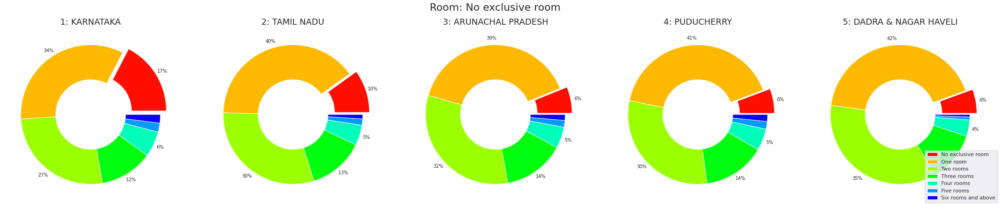

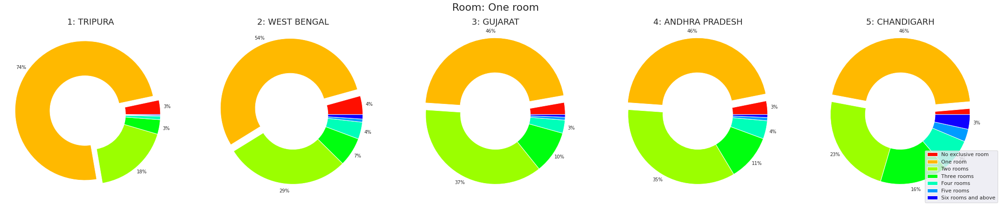

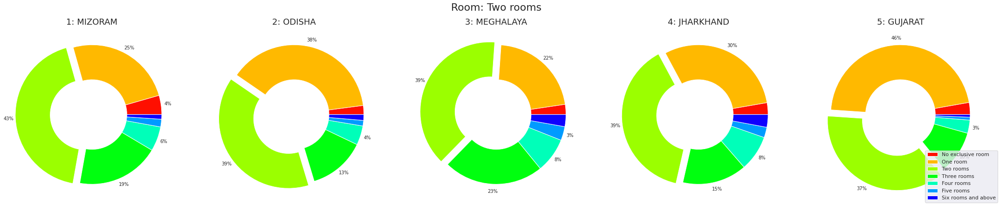

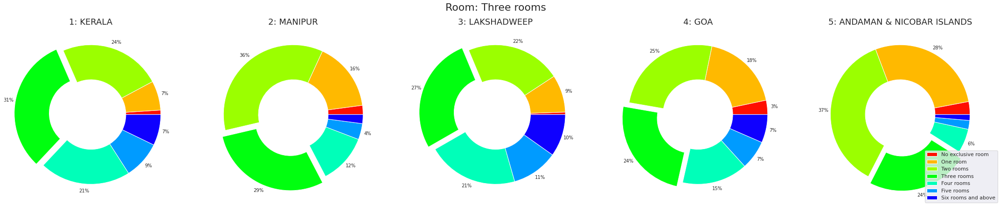

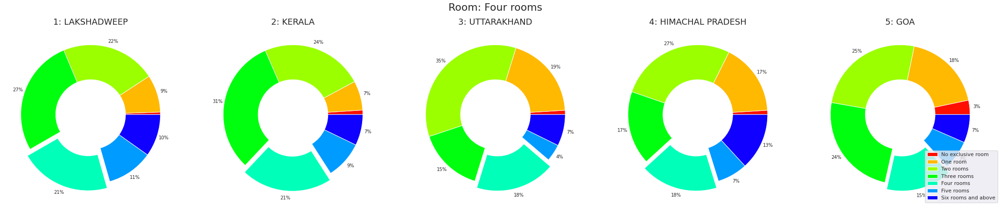

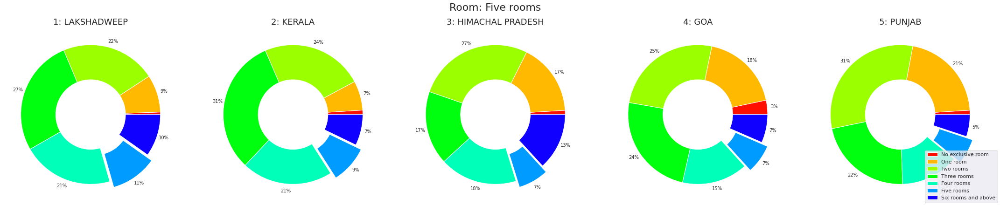

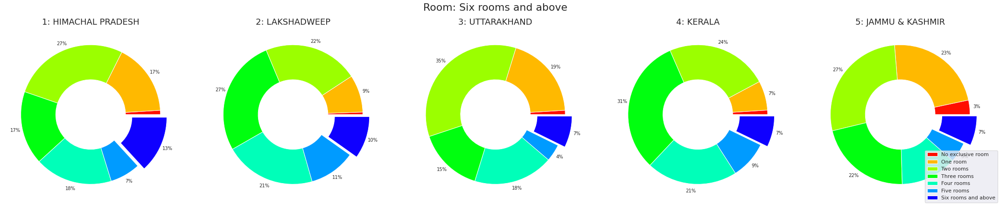

In [19]:
k = df_room.drop(['District Code'], axis=1)
l =k.groupby('State Name').agg('mean')

palette_color3 = sns.hls_palette(9, l=0.5, s=1)

y = 0
for z in l.columns:
  fig, axs = plt.subplots(1,5,figsize=(30,6),  constrained_layout = True)
  fig.suptitle('Room: {}'.format(z), fontsize=22)
  x = l.sort_values(by=z, ascending=False)
  cnt = 0
  for i in x.index[:5]:
    keys = x.columns
    values = x.loc[i]
    axs[cnt].pie(x=values, labels=None, colors=palette_color3, autopct=my_pct,
              pctdistance=1.1,wedgeprops=dict(width=.5),explode=(values == values[y]) * 0.1)
    axs[cnt].set_title('{}: {}'.format(cnt+1,i), fontsize=18)
    axs[cnt].set_label(None)
    cnt+=1
    

  y+=1
  fig.legend(labels = keys, loc='lower right')  
  plt.show()

**Most of the states have one room. Two rooms are also common. Himachal Pradesh has the most percentage of homes with 6 rooms and above. Lakhadweep, Himachal Pradesh, Goa and Uttarakhand have ranked really well in the homes with more than 3 rooms.**

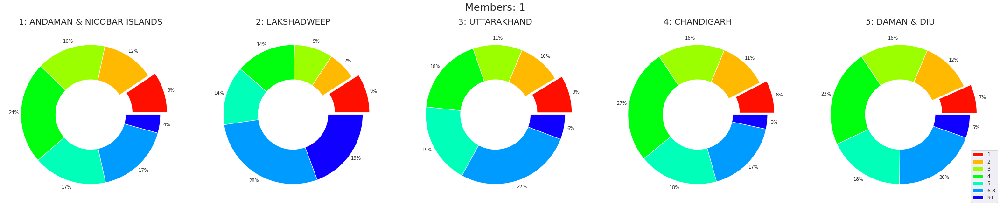

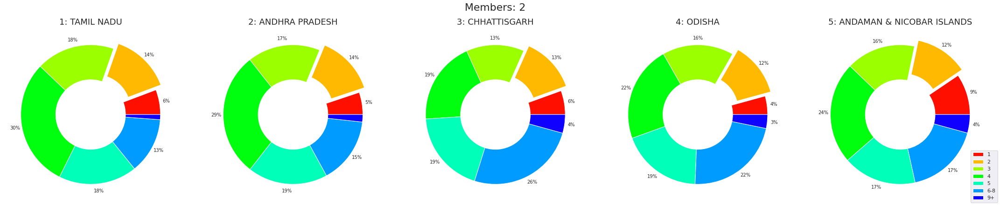

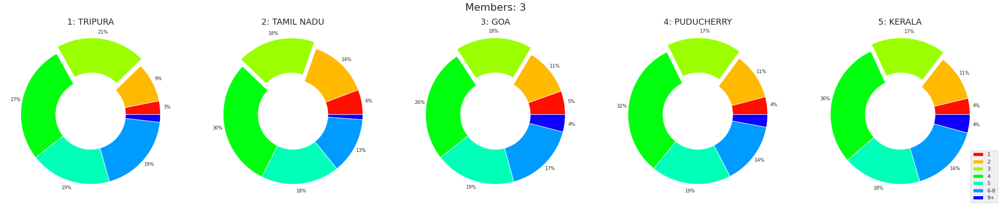

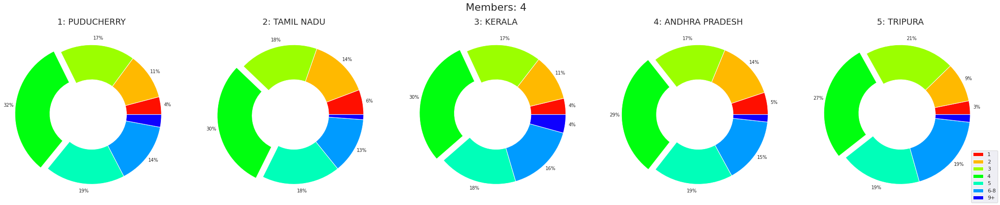

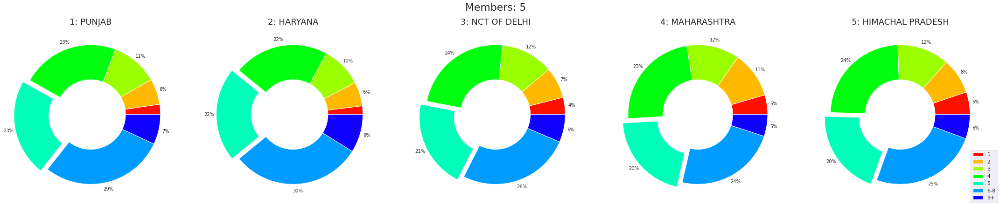

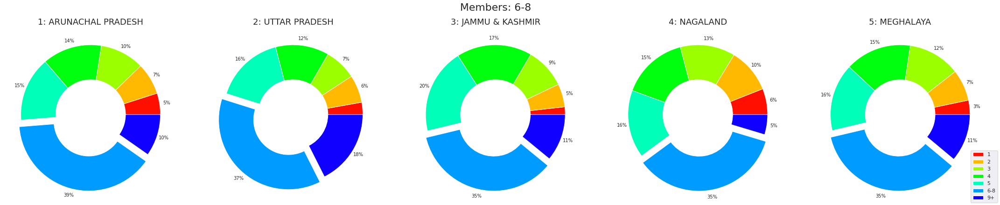

In [21]:
k = df_hhold.drop(['District Code'], axis=1)
l =k.groupby('State Name').agg('mean')

palette_color3 = sns.hls_palette(9, l=0.5, s=1)

y = 0
for z in l.columns[:-1]:
  fig, axs = plt.subplots(1,5,figsize=(30,6),  constrained_layout = True)
  fig.suptitle('Members: {}'.format(z), fontsize=22)
  x = l.sort_values(by=z, ascending=False)
  cnt = 0
  for i in x.index[:5]:
    keys = x.columns
    values = x.loc[i]
    axs[cnt].pie(x=values, labels=None, colors=palette_color3, autopct=my_pct,
              pctdistance=1.1,wedgeprops=dict(width=.5),explode=(values == values[y]) * 0.1)
    axs[cnt].set_title('{}: {}'.format(cnt+1,i), fontsize=18)
    axs[cnt].set_label(None)
    cnt+=1
    

  y+=1
  fig.legend(labels = keys, loc='lower right')  
  plt.show()

**df_hhold: There are a lot of households with over 4 people in the house. Very few of the homes have less than 4 members. This might point to the joint family culture in India.**

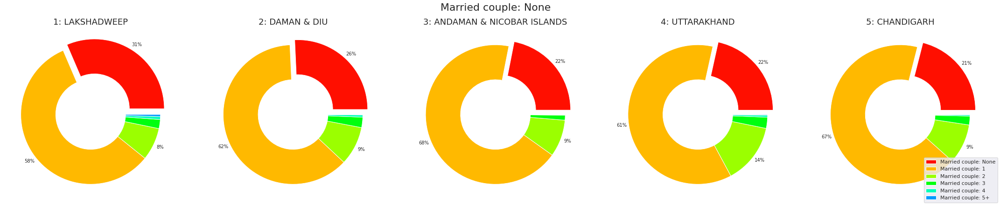

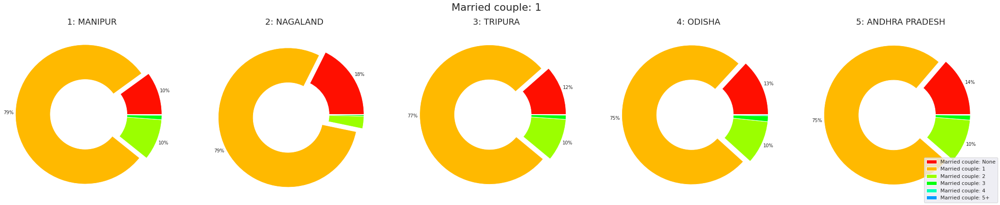

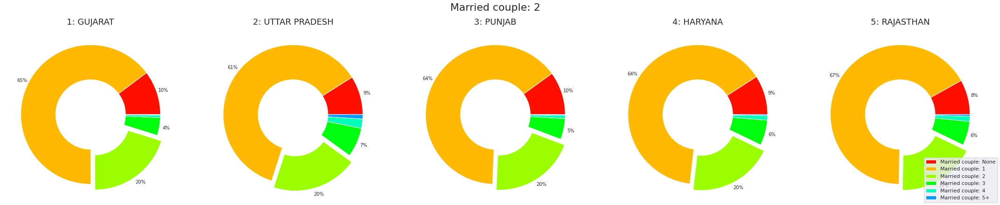

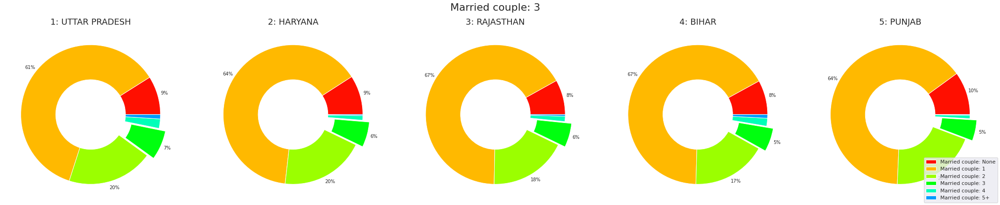

In [26]:
k = df_couple.drop(['District Code'], axis=1)
l =k.groupby('State Name').agg('mean')

palette_color3 = sns.hls_palette(9, l=0.5, s=1)

y = 0
for z in l.columns[:-2]:
  fig, axs = plt.subplots(1,5,figsize=(30,6),  constrained_layout = True)
  fig.suptitle('{}'.format(z), fontsize=22)
  x = l.sort_values(by=z, ascending=False)
  cnt = 0
  for i in x.index[:5]:
    keys = x.columns
    values = x.loc[i]
    axs[cnt].pie(x=values, labels=None, colors=palette_color3, autopct=my_pct,
              pctdistance=1.1,wedgeprops=dict(width=.5),explode=(values == values[y]) * 0.1)
    axs[cnt].set_title('{}: {}'.format(cnt+1,i), fontsize=18)
    axs[cnt].set_label(None)
    cnt+=1
    

  y+=1
  fig.legend(labels = keys, loc='lower right')  
  plt.show()

**df_couple: In most of the homes, there is one couple. We also saw that most of the homes had more than 4 people in a home. So, we can say two things: </br> most of the homes have children and elder people. </br>the number of children and old people is lower in the homes.**

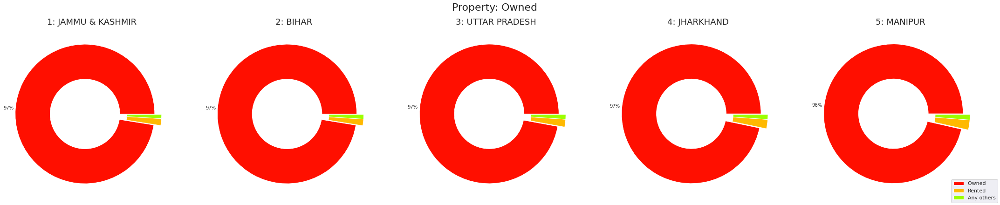

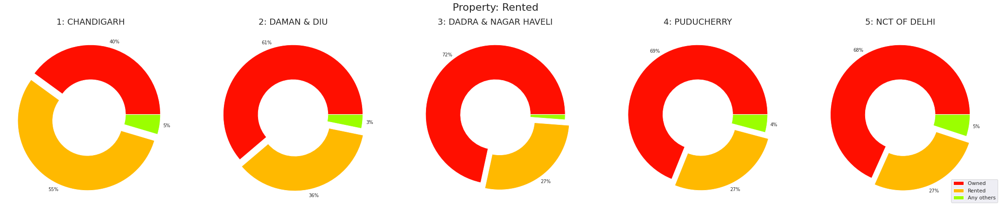

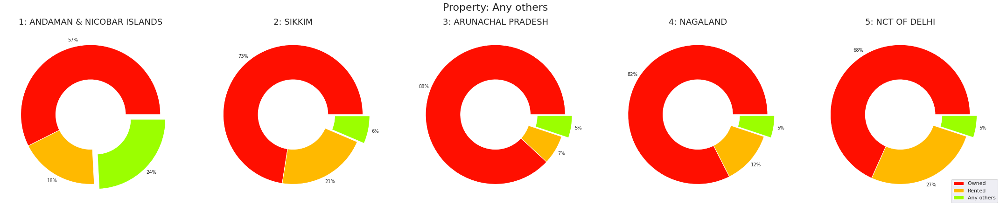

In [27]:
k = df_owner.drop(['District Code'], axis=1)
l =k.groupby('State Name').agg('mean')

palette_color3 = sns.hls_palette(9, l=0.5, s=1)

y = 0
for z in l.columns:
  fig, axs = plt.subplots(1,5,figsize=(30,6),  constrained_layout = True)
  fig.suptitle('Property: {}'.format(z), fontsize=22)
  x = l.sort_values(by=z, ascending=False)
  cnt = 0
  for i in x.index[:5]:
    keys = x.columns
    values = x.loc[i]
    axs[cnt].pie(x=values, labels=None, colors=palette_color3, autopct=my_pct,
              pctdistance=1.1,wedgeprops=dict(width=.5),explode=(values == values[y]) * 0.1)
    axs[cnt].set_title('{}: {}'.format(cnt+1,i), fontsize=18)
    axs[cnt].set_label(None)
    cnt+=1
    

  y+=1
  fig.legend(labels = keys, loc='lower right')  
  plt.show()

**df_owner: Most of the homes are owned in the country. Chandigarh, Daman & Diu, Puducherry and Dadra & Nagar Haveli have a significant fraction of rented properties.**

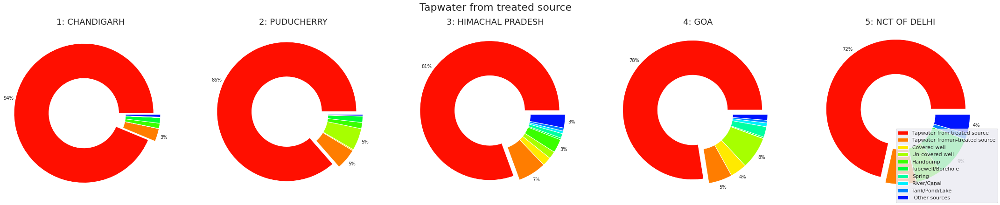

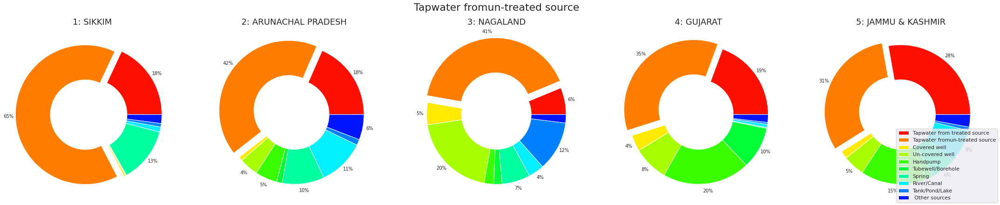

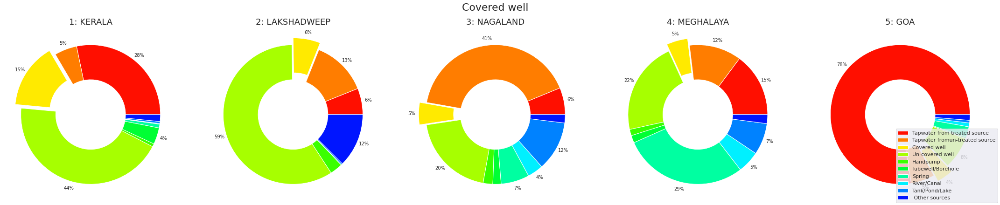

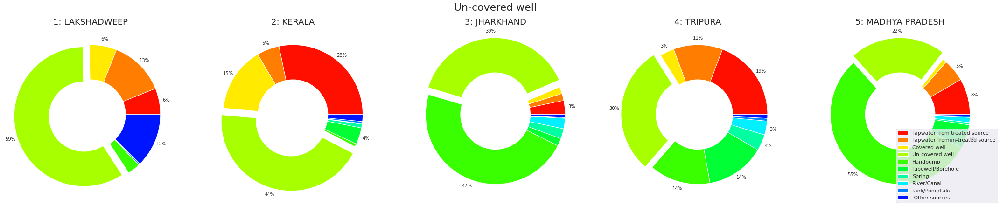

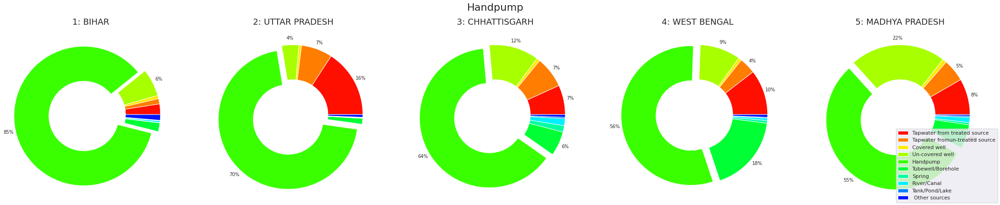

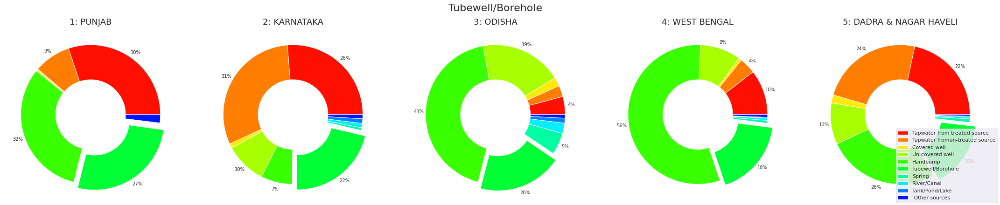

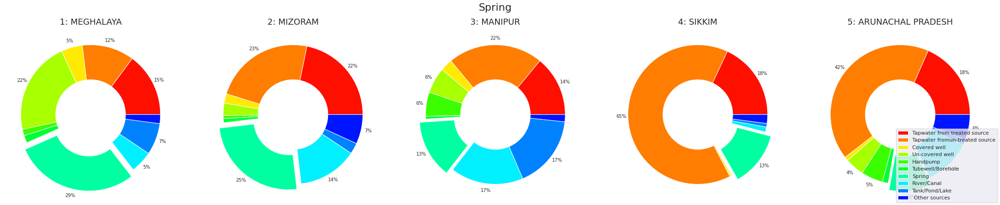

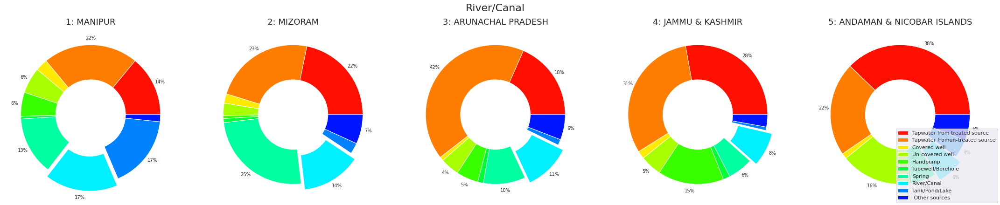

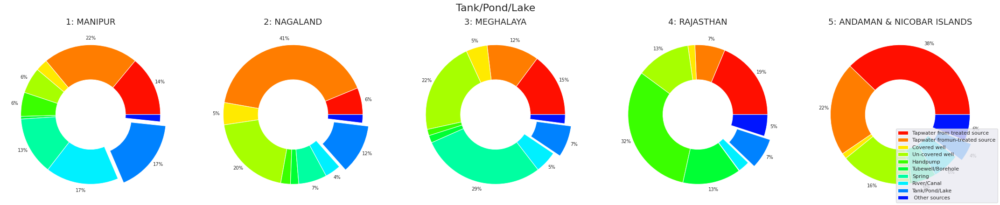

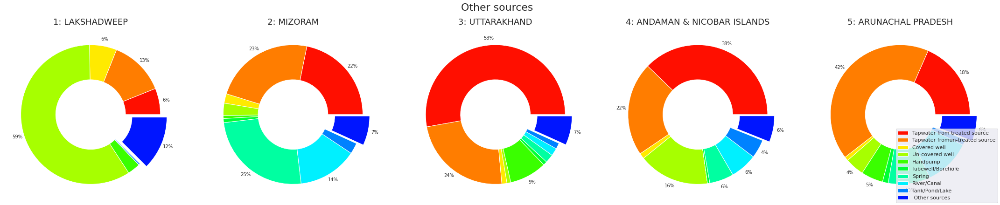

In [29]:
k = df_water.drop(['District Code'], axis=1)
l =k.groupby('State Name').agg('mean')

palette_color3 = sns.hls_palette(14, l=0.5, s=1)

y = 0
for z in l.columns:
  fig, axs = plt.subplots(1,5,figsize=(30,6),  constrained_layout = True)
  fig.suptitle('{}'.format(z), fontsize=22)
  x = l.sort_values(by=z, ascending=False)
  cnt = 0
  for i in x.index[:5]:
    keys = x.columns
    values = x.loc[i]
    axs[cnt].pie(x=values, labels=None, colors=palette_color3, autopct=my_pct,
              pctdistance=1.1,wedgeprops=dict(width=.5),explode=(values == values[y]) * 0.1)
    axs[cnt].set_title('{}: {}'.format(cnt+1,i), fontsize=18)
    axs[cnt].set_label(None)
    cnt+=1
    

  y+=1
  fig.legend(labels = keys, loc='lower right')  
  plt.show()

**df_water: The diversity we see in water sources is unique. Some union territories like Chandigarh and Puducherry get more than 75% from tapwater from treated source. WHile states like Bihar and Uttar Pradesh rely heavily on handpumps. Springs are common in the hilly states like Meghalaya, Mizoram and Manipur.**

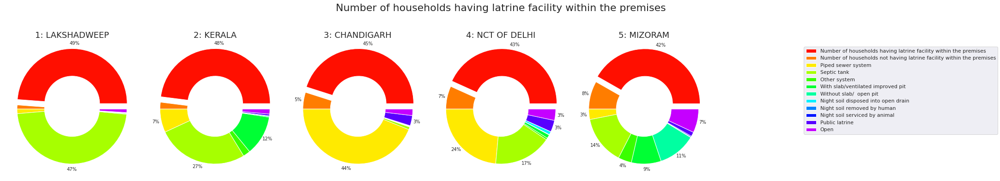

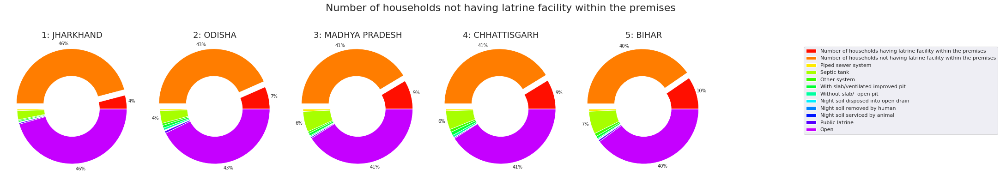

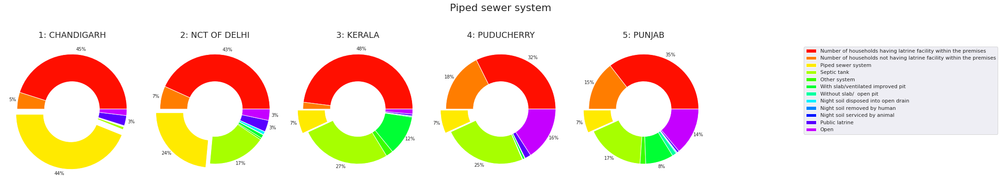

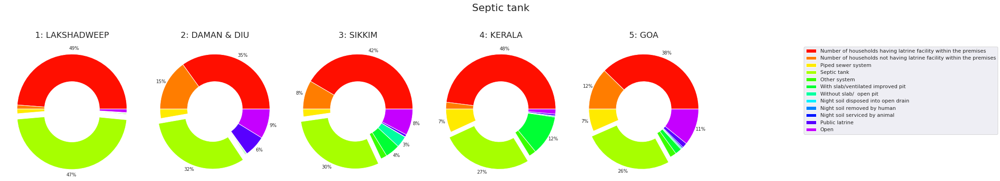

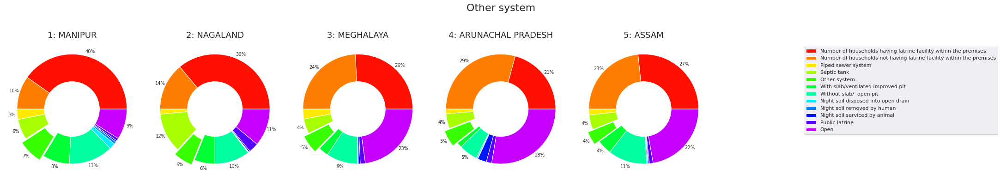

...

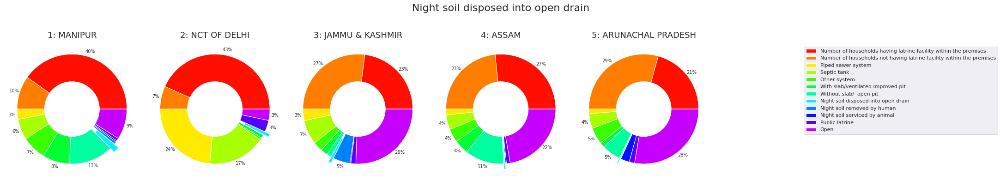

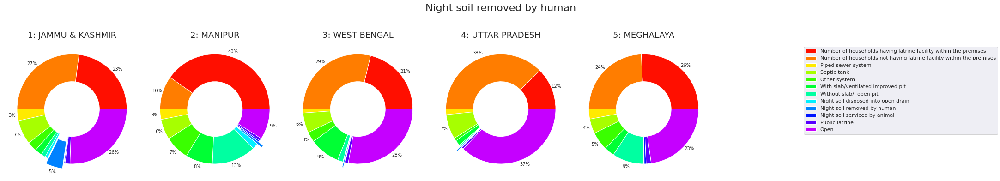

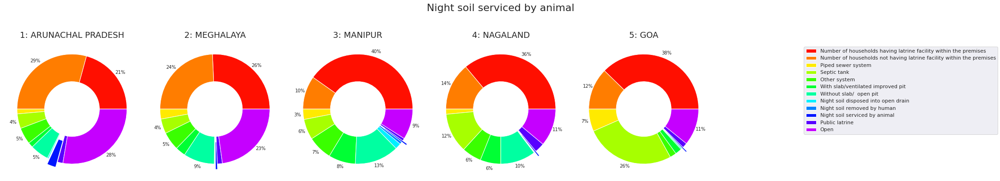

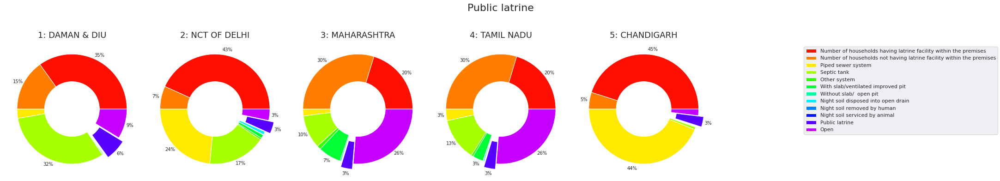

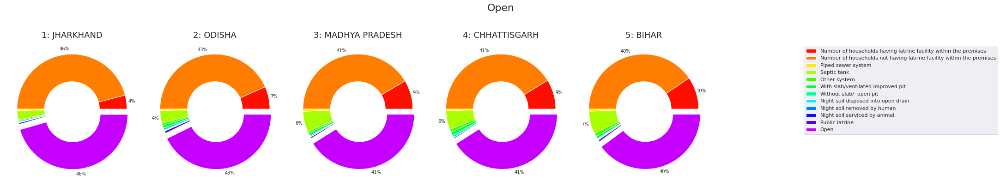

In [35]:
k = df_toilet.drop(['District Code'], axis=1)
l =k.groupby('State Name').agg('mean')

palette_color3 = sns.hls_palette(14, l=0.5, s=1)

y = 0
for z in l.columns:
  fig, axs = plt.subplots(1,7,figsize=(30,6),  constrained_layout = True)
  fig.suptitle('{}'.format(z), fontsize=22)
  x = l.sort_values(by=z, ascending=False)
  cnt = 0
  for i in x.index[:5]:
    keys = x.columns
    values = x.loc[i]
    axs[cnt].pie(x=values, labels=None, colors=palette_color3, autopct=my_pct,
              pctdistance=1.1,wedgeprops=dict(width=.5),explode=(values == values[y]) * 0.1)
    axs[cnt].set_title('{}: {}'.format(cnt+1,i), fontsize=18)
    axs[cnt].set_label(None)
    cnt+=1
  axs[5].set_visible(False)
  axs[6].set_visible(False)  

  y+=1
  fig.legend(labels = keys, loc='right')  
  plt.show()

**df_toilet: Even the top ranking states have less than 50% of the homes with toilet inside. In the poorer states, the percentage of people not having toilets in the homes, and going in the open is very high. Only Chandigarh has high percentage of homes with piped sewer system. Spetic tanks are very common for the houses having toilets inside.**

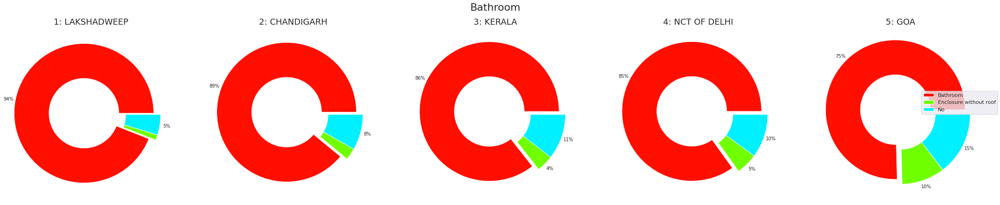

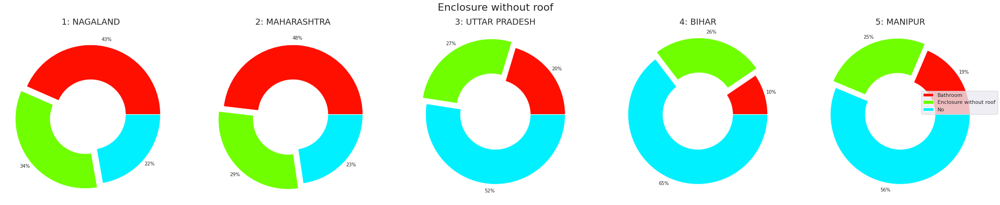

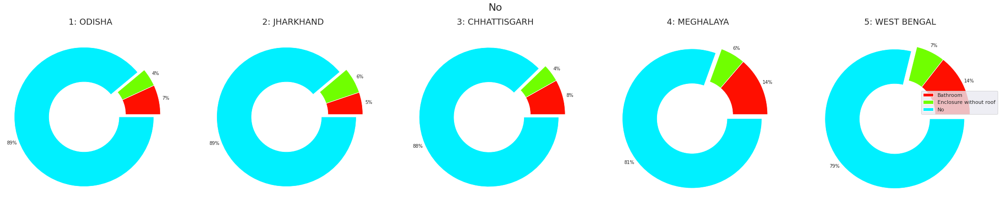

In [36]:
k = df_bath.drop(['District Code'], axis=1)
l =k.groupby('State Name').agg('mean')

palette_color3 = sns.hls_palette(4, l=0.5, s=1)

y = 0
for z in l.columns:
  fig, axs = plt.subplots(1,5,figsize=(30,6),  constrained_layout = True)
  fig.suptitle('{}'.format(z), fontsize=22)
  x = l.sort_values(by=z, ascending=False)
  cnt = 0
  for i in x.index[:5]:
    keys = x.columns
    values = x.loc[i]
    axs[cnt].pie(x=values, labels=None, colors=palette_color3, autopct=my_pct,
              pctdistance=1.1,wedgeprops=dict(width=.5),explode=(values == values[y]) * 0.1)
    axs[cnt].set_title('{}: {}'.format(cnt+1,i), fontsize=18)
    axs[cnt].set_label(None)
    cnt+=1


  y+=1
  fig.legend(labels = keys, loc='right')  
  plt.show()

**df_bath: Many places have no bathroom facillities in the country. The good performing states are the same as earlier like Lakhadweep, Kerala, Chandigarh, Goa and  Daman & Diu. The situation is very bad in poorer states where more than 3/4 of the state has no bathrooms.**

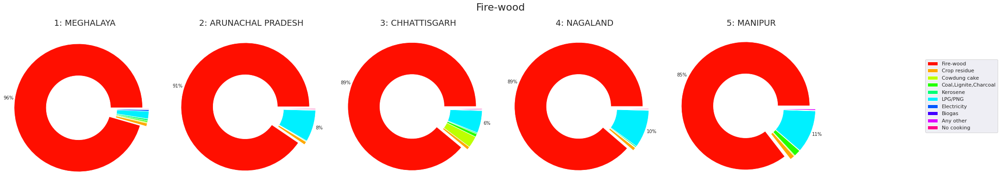

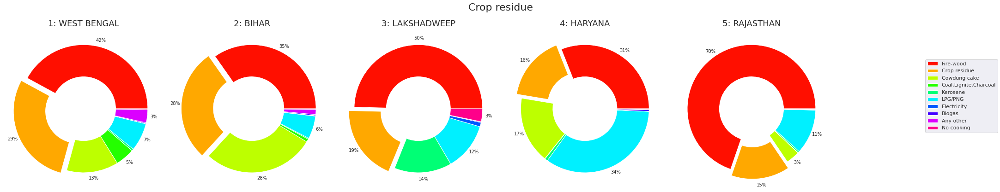

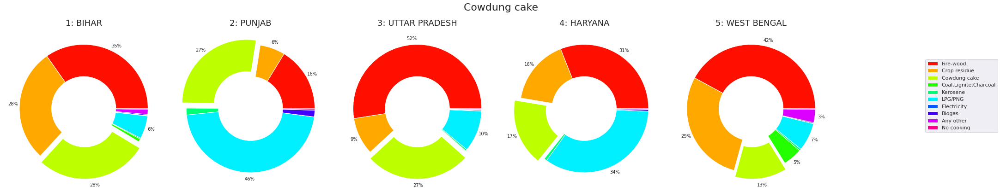

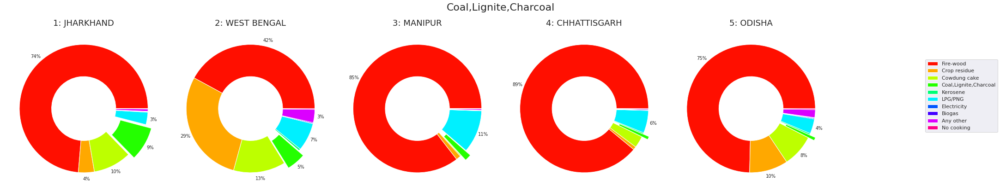

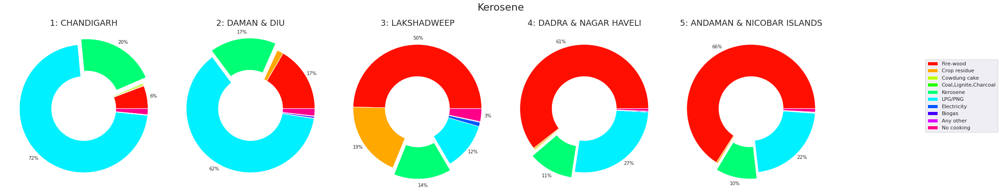

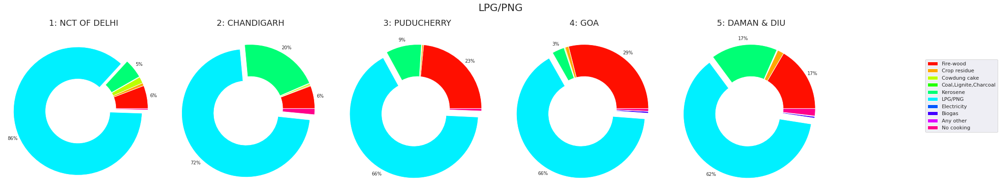

In [40]:
k = df_fuel.drop(['District Code'], axis=1)
l =k.groupby('State Name').agg('mean')

palette_color3 = sns.hls_palette(10, l=0.5, s=1)

y = 0
for z in l.columns[:-4]:
  fig, axs = plt.subplots(1,6,figsize=(30,6),  constrained_layout = True)
  fig.suptitle('{}'.format(z), fontsize=22)
  x = l.sort_values(by=z, ascending=False)
  cnt = 0
  for i in x.index[:5]:
    keys = x.columns
    values = x.loc[i]
    axs[cnt].pie(x=values, labels=None, colors=palette_color3, autopct=my_pct,
              pctdistance=1.1,wedgeprops=dict(width=.5),explode=(values == values[y]) * 0.1)
    axs[cnt].set_title('{}: {}'.format(cnt+1,i), fontsize=18)
    axs[cnt].set_label(None)
    cnt+=1
  axs[5].set_visible(False)

  y+=1
  fig.legend(labels = keys, loc='right')  
  plt.show()

**df_fuel: Firewood is the most common fuel used for cooking in the north-eastern states, and it is justified because of the forests present there. And also their connectivity is not good for all times, so they are more dependant on the local produce. LPG/CNG is used in the developed states and UTs like Chandigarh, Goa, Delhi etc.**

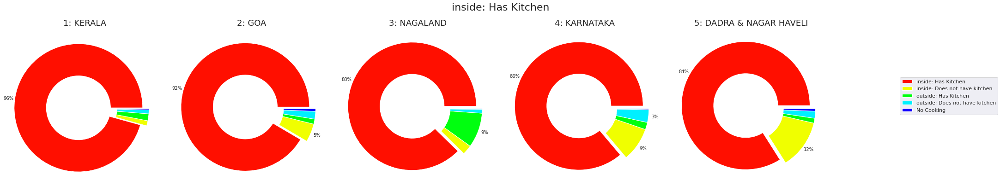

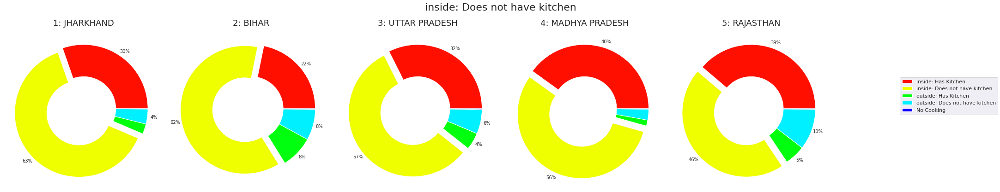

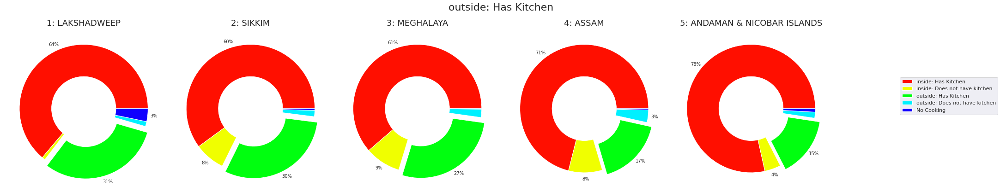

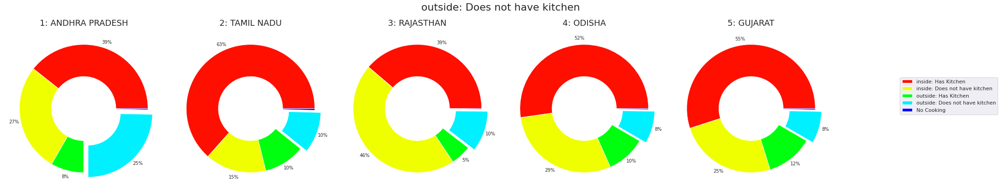

In [43]:
k = df_kitchen.drop(['District Code'], axis=1)
l =k.groupby('State Name').agg('mean')

palette_color3 = sns.hls_palette(6, l=0.5, s=1)

y = 0
for z in l.columns[:-1]:
  fig, axs = plt.subplots(1,6,figsize=(30,6),  constrained_layout = True)
  fig.suptitle('{}'.format(z), fontsize=22)
  x = l.sort_values(by=z, ascending=False)
  cnt = 0
  for i in x.index[:5]:
    keys = x.columns
    values = x.loc[i]
    axs[cnt].pie(x=values, labels=None, colors=palette_color3, autopct=my_pct,
              pctdistance=1.1,wedgeprops=dict(width=.5),explode=(values == values[y]) * 0.1)
    axs[cnt].set_title('{}: {}'.format(cnt+1,i), fontsize=18)
    axs[cnt].set_label(None)
    cnt+=1
  axs[5].set_visible(False)
 

  y+=1
  fig.legend(labels = keys, loc='right')  
  plt.show()

**df_kitchen: The situation is almost the same. The states which have performed well earlier continue to do so, while the states performing low are still performing low.**

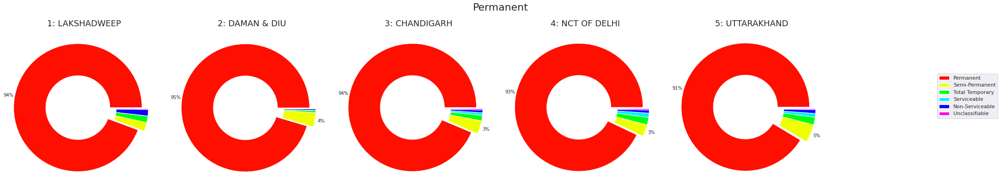

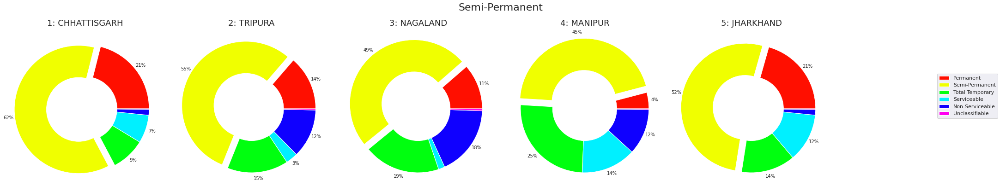

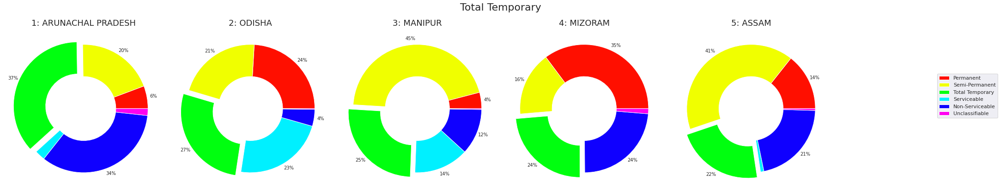

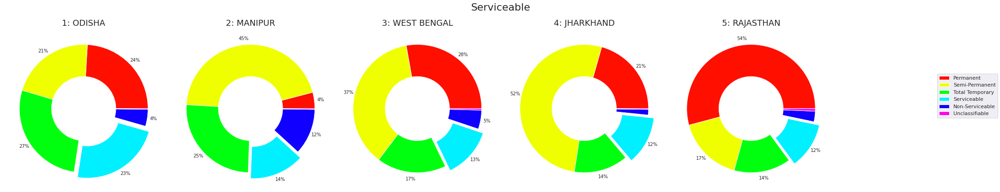

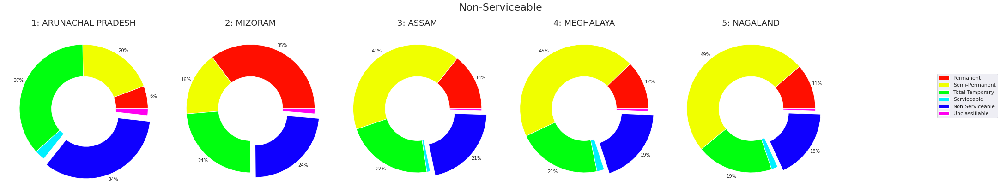

In [46]:
k = df_house.drop(['District Code'], axis=1)
l =k.groupby('State Name').agg('mean')

palette_color3 = sns.hls_palette(6, l=0.5, s=1)

y = 0
for z in l.columns[:-1]:
  fig, axs = plt.subplots(1,6,figsize=(30,6),  constrained_layout = True)
  fig.suptitle('{}'.format(z), fontsize=22)
  x = l.sort_values(by=z, ascending=False)
  cnt = 0
  for i in x.index[:5]:
    keys = x.columns
    values = x.loc[i]
    axs[cnt].pie(x=values, labels=None, colors=palette_color3, autopct=my_pct,
              pctdistance=1.1,wedgeprops=dict(width=.5),explode=(values == values[y]) * 0.1)
    axs[cnt].set_title('{}: {}'.format(cnt+1,i), fontsize=18)
    axs[cnt].set_label(None)
    cnt+=1
  axs[5].set_visible(False) 

  y+=1
  fig.legend(labels = keys, loc='right')  
  plt.show()

**df_house: Most of the houses in the country are permanent. Most of the temporary and semi-permanent houses are in the north-eastern states, this is probablydue to the building materials available there.**

In [13]:
from prettytable import PrettyTable

#checking for the maximum and minimum percentages as well as numbers:
cnt = 0
for i in dataframes:
  l =i.groupby('State Name').agg('mean')
  s = l.idxmax(axis=0)
  t = l.idxmin(axis=0)
  # k = pd.DataFrame(k)
  # k.columns= ['State with Max percentage', 'State with Min percentage']
  mytable = PrettyTable(['Facility: '+ list_want[cnt], 'State with Max percentage'])
  for z,r in s.items():
    if z!= 'District Code':
      mytable.add_row([z,r])
  mytable.add_column('State with Min percentage', list(t.values)[1:])
  print(mytable)
  print('')
  cnt+=1

+--------------------------------------+---------------------------+---------------------------+
|            Facility: roof            | State with Max percentage | State with Min percentage |
+--------------------------------------+---------------------------+---------------------------+
| Grass/ Thatch/ Bamboo/ Wood/Mud etc. |     ARUNACHAL PRADESH     |        DAMAN & DIU        |
|          Plastic/ Polythene          |           ASSAM           |        LAKSHADWEEP        |
|           Hand made Tiles            |        CHHATTISGARH       | ANDAMAN & NICOBAR ISLANDS |
|          Machine made Tiles          |            GOA            | ANDAMAN & NICOBAR ISLANDS |
|             Burnt Brick              |       UTTAR PRADESH       | ANDAMAN & NICOBAR ISLANDS |
|             Stone/ Slate             |        UTTARAKHAND        |        LAKSHADWEEP        |
|     G.I./Metal/ Asbestos sheets      |          TRIPURA          |           PUNJAB          |
|               Concrete      

**Seeing the correlation of living conditions with the rest of the features**

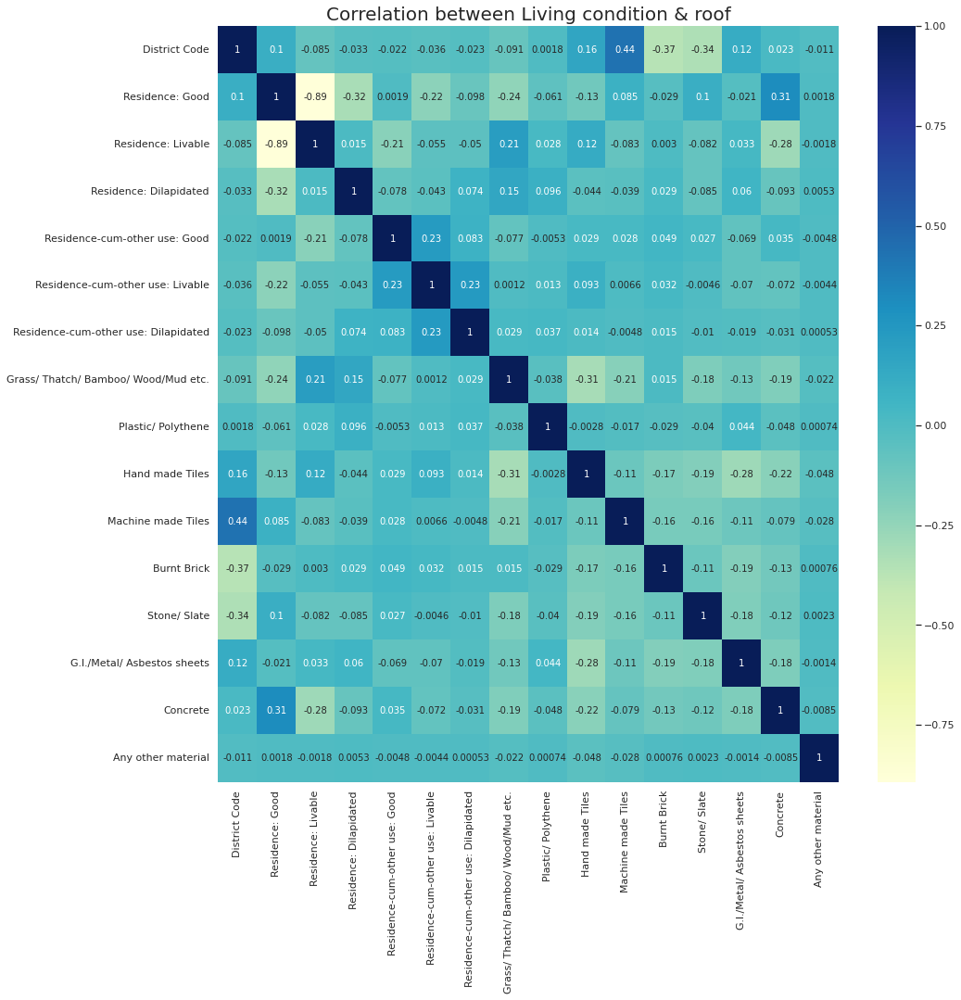

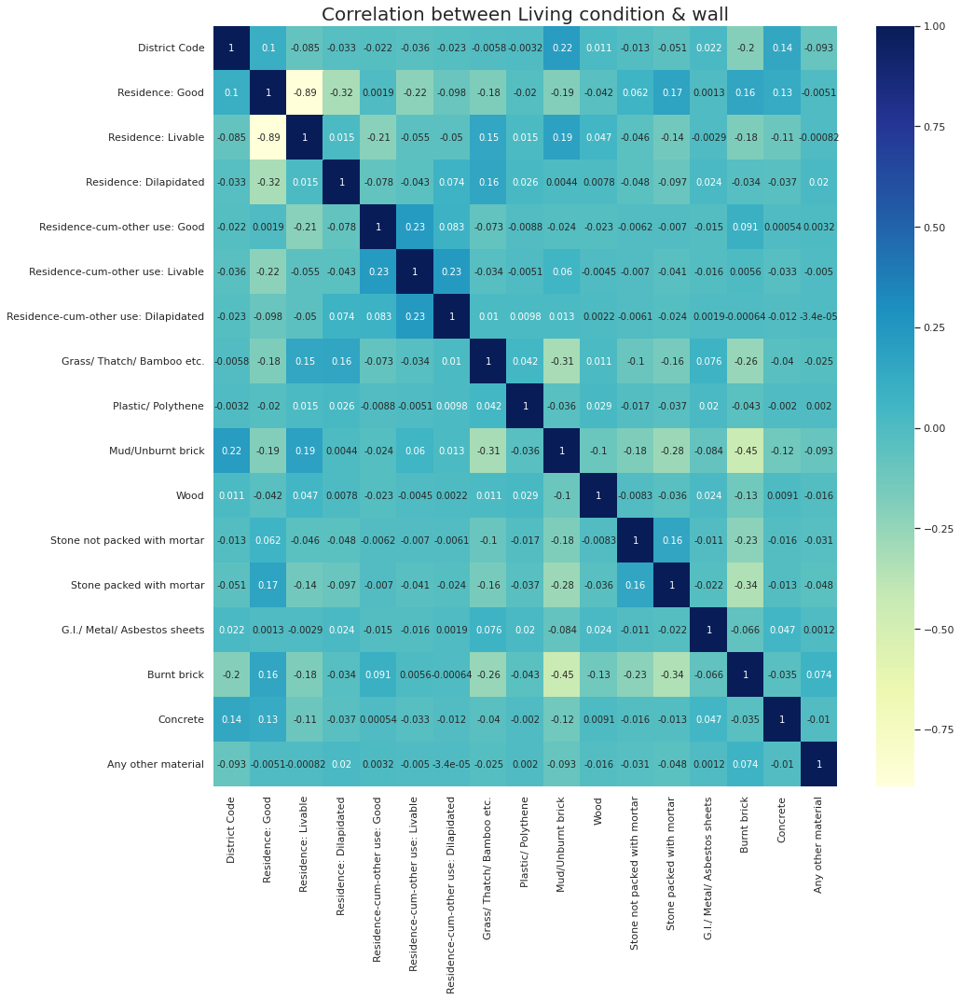

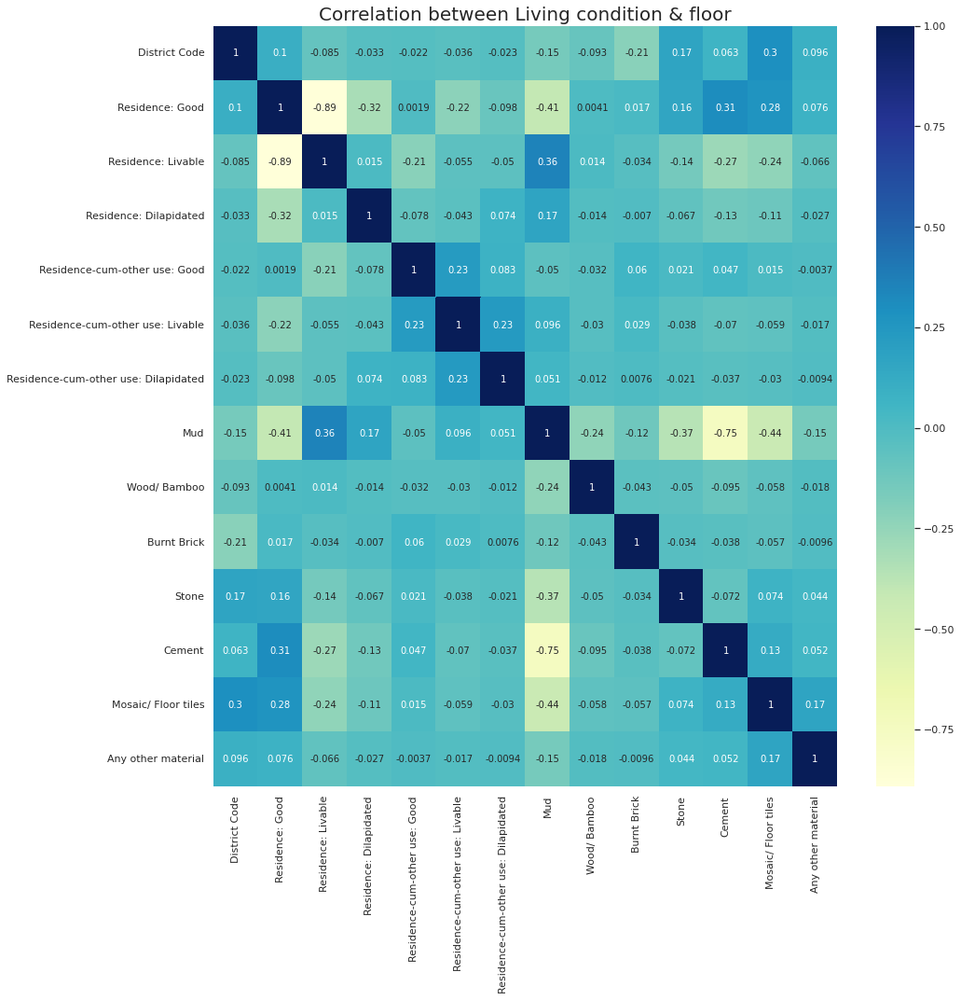

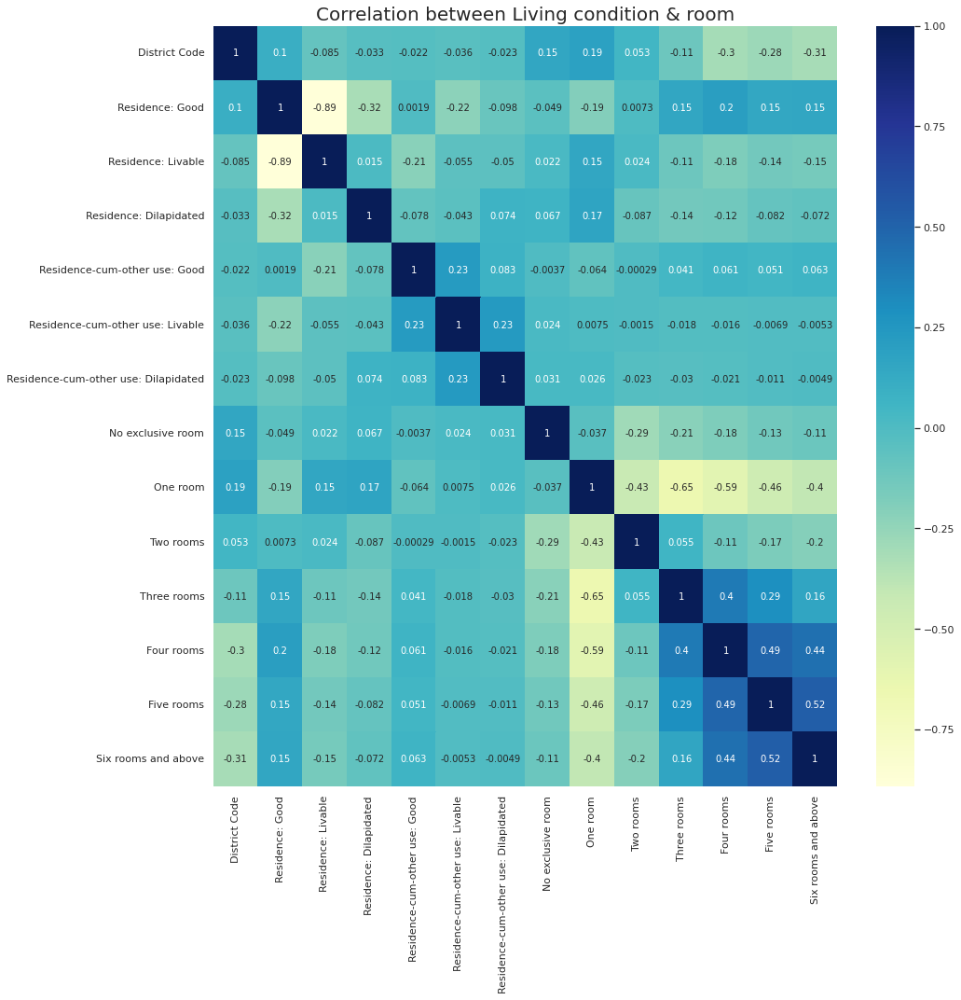

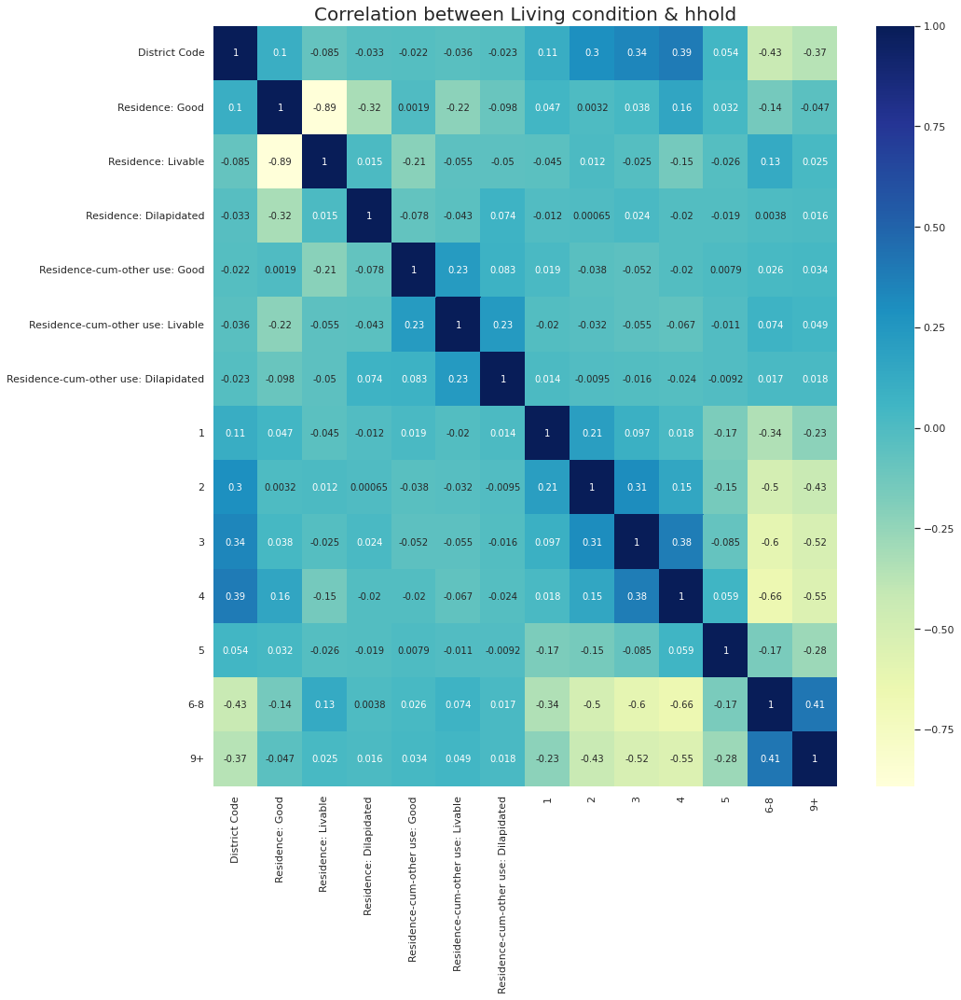

...

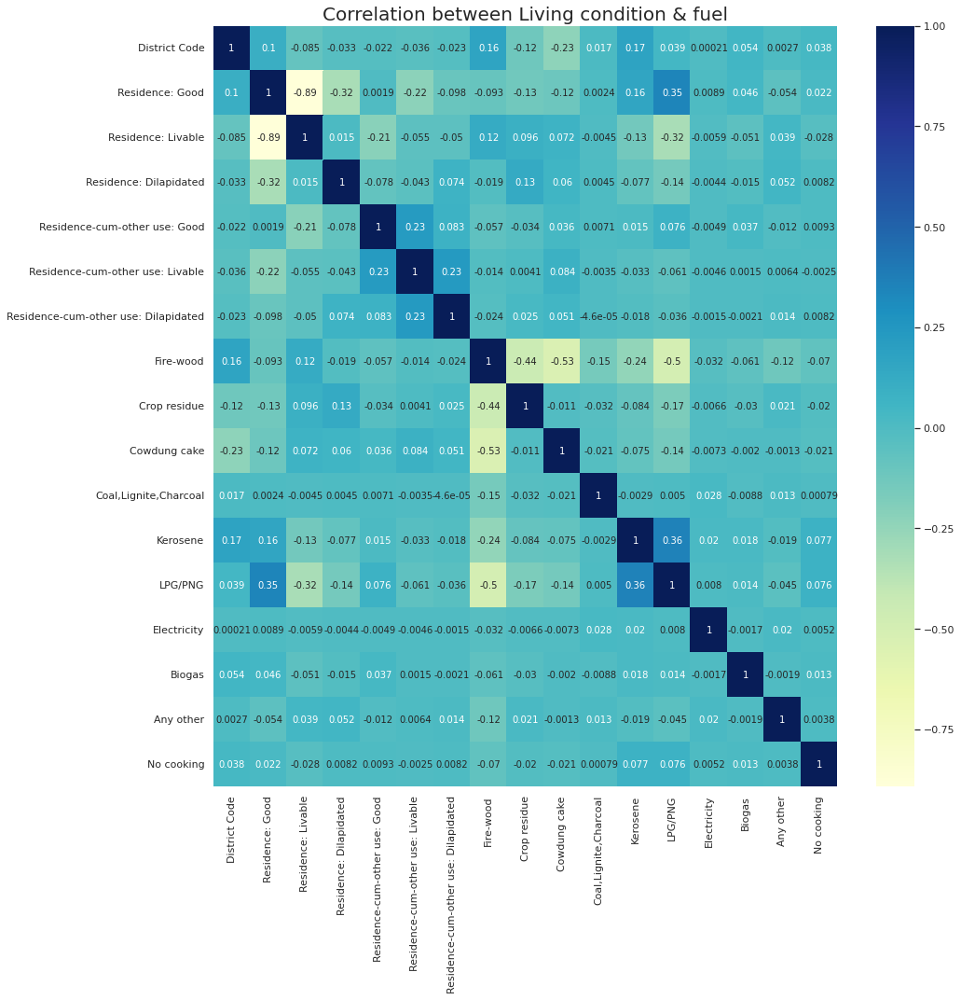

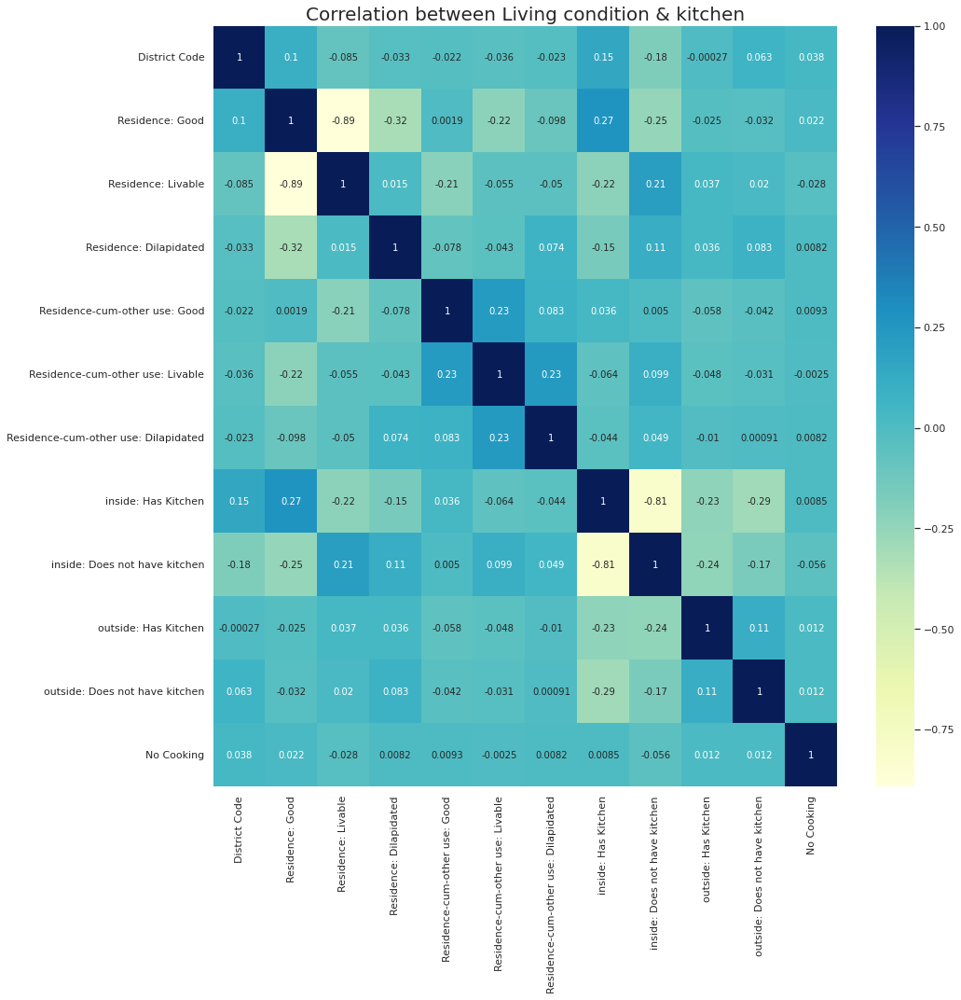

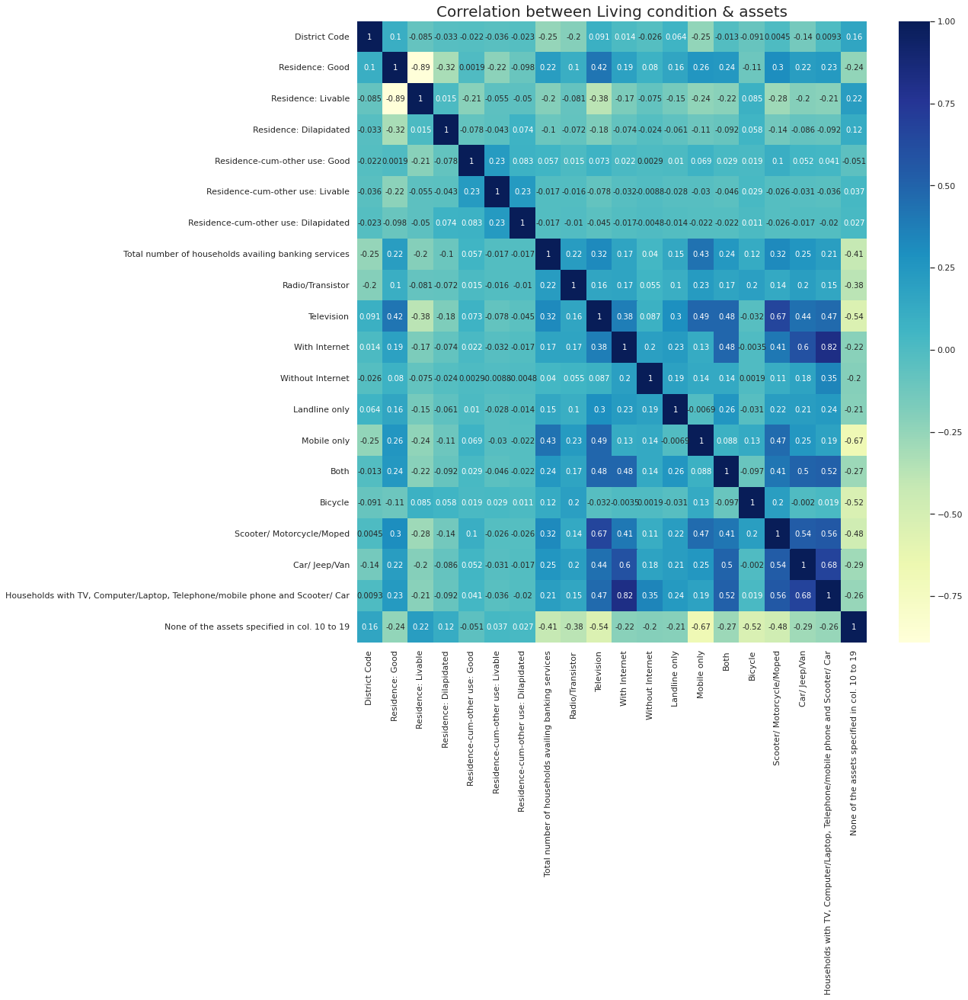

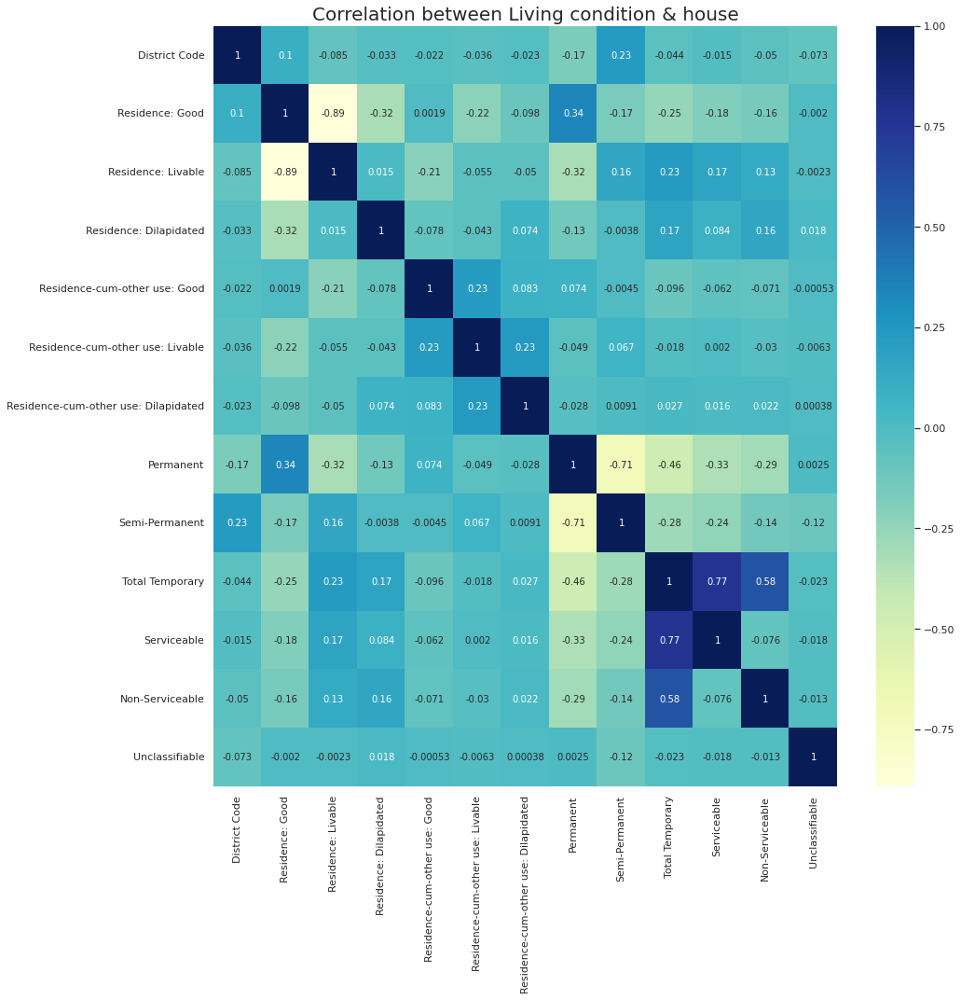

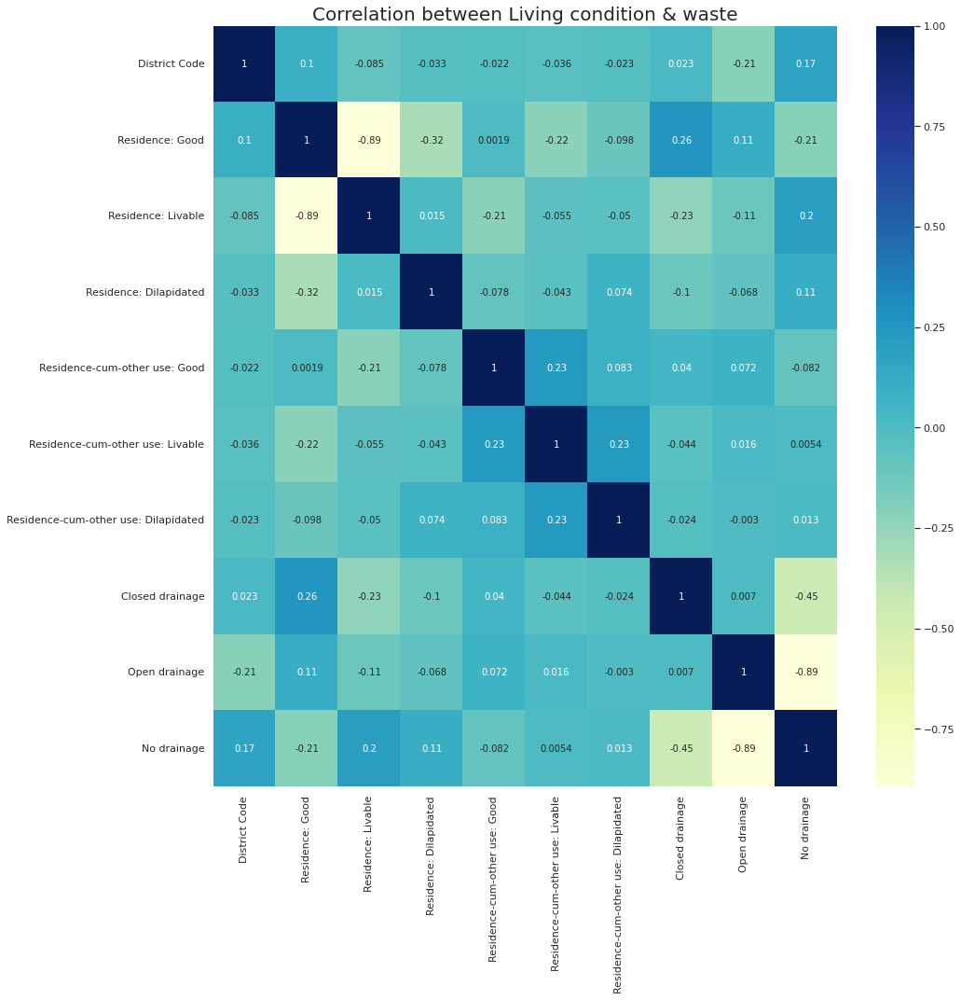

In [11]:
cnt = 0
for i in dataframes:
  if len(i.columns)!=len(df_condn.columns):
    df_join = df_condn.join(i.drop(['State Code', 'State Name', 'District Code', 'District Name'], axis=1))
    fig = plt.figure(figsize=(15,15))
    plt.title('Correlation between Living condition & '+list_want[cnt], fontsize=20)
    cnt+=1
    dataplot = sns.heatmap(df_join.corr(), cmap="YlGnBu", annot=True)
  elif len(i.columns)==len(df_condn.columns):
    if all(i.columns == df_condn.columns):
      cnt+=1
      pass
    else:
      df_join = df_condn.join(i.drop(['State Code', 'State Name', 'District Code', 'District Name'], axis=1))
      fig = plt.figure(figsize=(15,15))
      plt.title('Correlation between Living condition & '+list_want[cnt], fontsize=20)
      cnt+=1
      dataplot = sns.heatmap(df_join.corr(), cmap="YlGnBu", annot=True)

**Inferences (from the plots not shown): </br>* High correlation between open and the number of households not having latrine facility within the premises, shows people who do not have latrine facility in the house mostly go out in the open as compared to public facillities.</br>* If there are latrine facility in the house the most common way of disposal is septic tank.</br>* If there is a bathroom in the household there is a high chance there is a latrine too.</br>* Temporary households have a high probability of being servicable.</br>* If there is a closed drainage system then a piped sewer system is the most common way of disposal.</br>* If there is a no drainage then open is the most common way of disposal**